<a href="https://colab.research.google.com/github/NataGoto/Bouquets_recommedation_system/blob/main/Pumps_111_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Мы видимо, что скорее всего, то, что названо виброускорением, скорее всего это и есть виброскорость. Она хорошо попадает в уставки.**

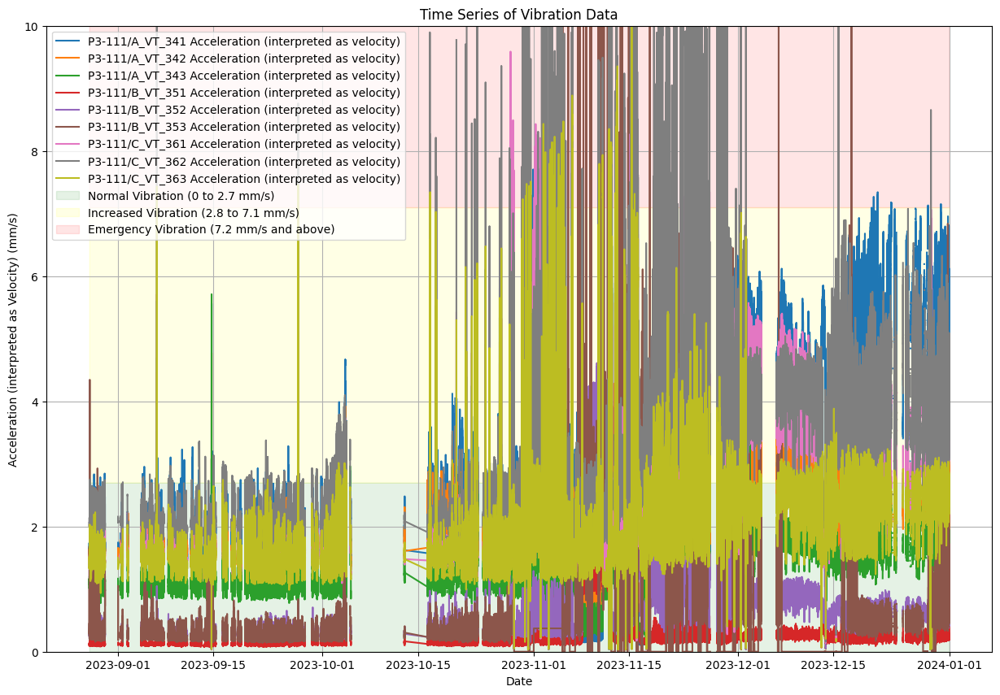

In [ ]:
# Отобразим визуализацию по уставкам, принимая виброускорение за виброскорость
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_non_std.csv')

df['time'] = pd.to_datetime(df['time'])

# Удаление возможных дубликатов
df = df.drop_duplicates(subset='time')

# Сортировка по дате
df.sort_values('time', inplace=True)

# Расчет временных интервалов в днях
df['time_diff'] = df['time'].diff().dt.total_seconds().fillna(0) / 86400

# Список колонок ускорения
acceleration_columns = [
    'P3-111/A_VT_341', 'P3-111/A_VT_342', 'P3-111/A_VT_343',
    'P3-111/B_VT_351', 'P3-111/B_VT_352', 'P3-111/B_VT_353',
    'P3-111/C_VT_361', 'P3-111/C_VT_362', 'P3-111/C_VT_363'
]

# Обеспечение безопасности индексации и доступа к данным
df.reset_index(drop=True, inplace=True)

# Визуализация данных
plt.figure(figsize=(15, 10))
for col in acceleration_columns:
    plt.plot(df['time'], df[col], label=f'{col} Acceleration (interpreted as velocity)')

# Определение уставок вибрации
normal_vibration_limit = 2.7
increased_vibration_limit = 7.1
emergency_vibration_limit = 10  # Укажем верхнюю границу как 10 для наглядности

# Выделение зон для нормальных, повышенных и аварийных вибраций
plt.fill_between(df['time'], 0, normal_vibration_limit, color='green', alpha=0.1, label='Normal Vibration (0 to 2.7 mm/s)')
plt.fill_between(df['time'], normal_vibration_limit, increased_vibration_limit, color='yellow', alpha=0.1, label='Increased Vibration (2.8 to 7.1 mm/s)')
plt.fill_between(df['time'], increased_vibration_limit, emergency_vibration_limit, color='red', alpha=0.1, label='Emergency Vibration (7.2 mm/s and above)')

plt.xlabel('Date')
plt.ylabel('Acceleration (interpreted as Velocity) (mm/s)')
plt.title('Time Series of Vibration Data')
plt.legend()
plt.grid(True)
plt.ylim(0, 10)  # Установка пределов оси Y от 0 до 10
plt.show()

# Сохранение обработанных данных
df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_non_std_with_velocity.csv', index=False)


In [ ]:
#А теперь работаем только со значениями по виброскорости.
import pandas as pd

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_non_std.csv')

# Преобразуем время в datetime
df['time'] = pd.to_datetime(df['time'])

# Список колонок ускорения, которые мы интерпретируем как скорость
acceleration_columns = [
    'P3-111/A_VT_341', 'P3-111/A_VT_342', 'P3-111/A_VT_343',
    'P3-111/B_VT_351', 'P3-111/B_VT_352', 'P3-111/B_VT_353',
    'P3-111/C_VT_361', 'P3-111/C_VT_362', 'P3-111/C_VT_363'
]

# Создаем DataFrame для хранения данных по значениям выше критической уставки
critical_df = df[acceleration_columns].apply(lambda x: x > 7.1)

# Переносим дату в этот DataFrame
critical_df['time'] = df['time']

# Фильтрация исходного DataFrame по критическим значениям
critical_df = df[critical_df[acceleration_columns].any(axis=1)]

# Выводим descriptive statistics для отфильтрованных данных
descriptive_stats = critical_df[acceleration_columns].describe().transpose()
descriptive_stats['sensor'] = descriptive_stats.index
descriptive_stats = descriptive_stats[['sensor', 'count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]

# Выводим результат
print(descriptive_stats.to_string(index=False))


         sensor  count      mean        std      min      25%      50%       75%         max
P3-111/A_VT_341 3021.0  3.210373   1.869944 0.185365 2.447326 2.885993  3.767400    7.924382
P3-111/A_VT_342 3021.0  3.287430   1.347322 0.610731 2.281359 2.952079  3.799689    7.921160
P3-111/A_VT_343 3021.0  2.470921   1.615146 0.280535 1.596427 1.820077  2.336400    6.523231
P3-111/B_VT_351 3021.0  0.488621   0.411416 0.163751 0.375571 0.427577  0.483424    4.125250
P3-111/B_VT_352 3021.0  1.178485   0.920925 0.322460 0.892780 1.038016  1.215834    9.088778
P3-111/B_VT_353 3021.0 30.381732 428.006044 0.000000 0.000000 0.718607  1.497248 9829.500119
P3-111/C_VT_361 3018.0  5.943100   1.134647 1.590972 5.134775 5.817312  6.891617    9.588287
P3-111/C_VT_362 3018.0  9.254919   2.610208 1.948980 7.863802 8.937319 10.406965   21.894775
P3-111/C_VT_363 3018.0  4.295723   1.741885 1.153006 3.029423 3.684390  5.823108   10.858964


**Видим, что значения приемлемые, неисправен только датчик ВТ 353,  есть завышенные отклоонения у датчика 352 и заниженные у датчика 351.**

In [ ]:
#Посмотрим, что у нас за статистика по превышениям критической уставки.
import pandas as pd

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_non_std.csv')

# Преобразуем время в datetime
df['time'] = pd.to_datetime(df['time'])

# Список колонок ускорения, которые мы интерпретируем как скорость
acceleration_columns = [
    'P3-111/A_VT_341', 'P3-111/A_VT_342', 'P3-111/A_VT_343',
    'P3-111/B_VT_351', 'P3-111/B_VT_352', 'P3-111/B_VT_353',
    'P3-111/C_VT_361', 'P3-111/C_VT_362', 'P3-111/C_VT_363'
]

# Создаем пустой DataFrame для хранения данных выше критической уставки
critical_dfs = []

# Фильтрация значений выше критической уставки и создание дескриптивной статистики для каждого датчика
for col in acceleration_columns:
    # Фильтрация данных, где значения больше 7.1
    filtered_df = df[df[col] > 7.1]
    # Рассчитываем descriptive statistics только для фильтрованных значений
    stats = filtered_df[col].describe()
    # Добавление названия датчика в статистику
    stats['sensor'] = col
    # Добавляем DataFrame в список
    critical_dfs.append(stats)

# Объединяем все статистики в один DataFrame
critical_stats_df = pd.DataFrame(critical_dfs).set_index('sensor')

# Выводим результат
print(critical_stats_df)


                  count         mean          std       min       25%  \
sensor                                                                  
P3-111/A_VT_341   151.0     7.329356     0.195615  7.100690  7.171989   
P3-111/A_VT_342     7.0     7.577819     0.257817  7.151637  7.472813   
P3-111/A_VT_343     0.0          NaN          NaN       NaN       NaN   
P3-111/B_VT_351     0.0          NaN          NaN       NaN       NaN   
P3-111/B_VT_352    35.0     8.435067     0.396220  7.103050  8.255735   
P3-111/B_VT_353    63.0  1415.479501  2632.883449  7.100725  7.540389   
P3-111/C_VT_361   563.0     7.539661     0.470250  7.100450  7.214289   
P3-111/C_VT_362  2756.0     9.712948     2.223913  7.103117  8.049432   
P3-111/C_VT_363   314.0     7.742016     0.438555  7.101357  7.446736   

                       50%          75%          max  
sensor                                                
P3-111/A_VT_341   7.269674     7.447934     7.924382  
P3-111/A_VT_342   7.545777     

**351 оставим, а 353 и 362 демасштабируем.**

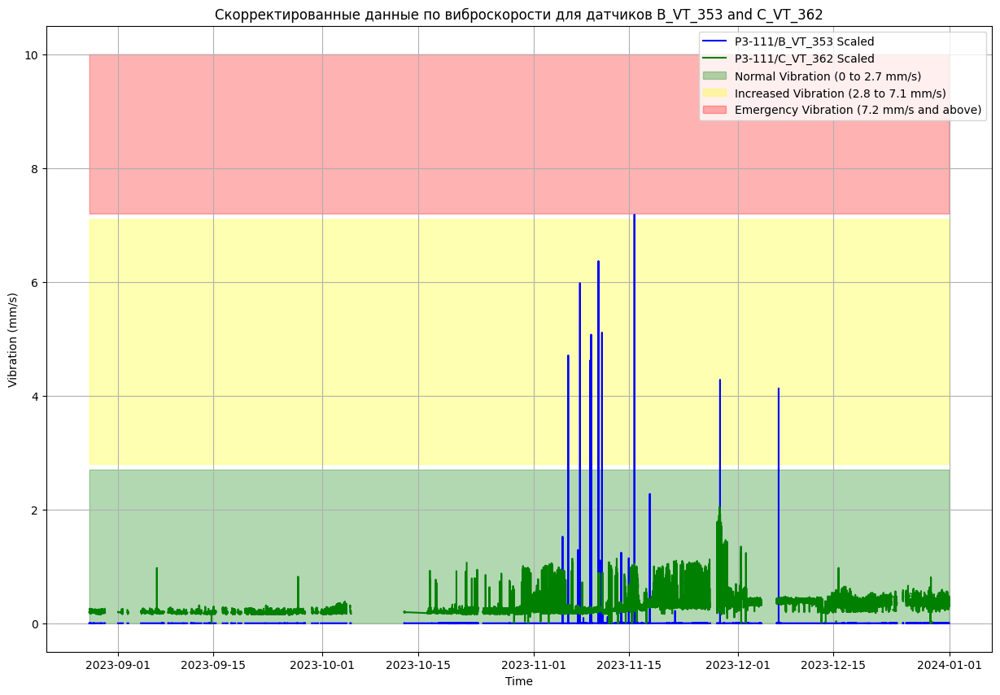

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# Демасштабируем неисправные датчики
# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_non_std.csv')
df['time'] = pd.to_datetime(df['time'])

# Расчеты для масштабирования
mean_A_VT_343 = df['P3-111/A_VT_343'].mean()
max_B_VT_353 = df['P3-111/B_VT_353'].max()
mean_C_VT_362 = df['P3-111/C_VT_362'].mean()

# Уменьшенное масштабирование для B_VT_353
scaling_factor_353 = (mean_A_VT_343 / max_B_VT_353) * 5  #

# Увеличенное масштабирование для C_VT_362
scaling_factor_362 = mean_A_VT_343 / mean_C_VT_362 * 0.2  #

# Применение коэффициентов масштабирования
df['P3-111/B_VT_353_scaled'] = df['P3-111/B_VT_353'] * scaling_factor_353
df['P3-111/C_VT_362_scaled'] = df['P3-111/C_VT_362'] * scaling_factor_362

# Визуализация
plt.figure(figsize=(15, 10))
plt.plot(df['time'], df['P3-111/B_VT_353_scaled'], label='P3-111/B_VT_353 Scaled', color='blue')
plt.plot(df['time'], df['P3-111/C_VT_362_scaled'], label='P3-111/C_VT_362 Scaled', color='green')

# Уставки вибрации
plt.fill_between(df['time'], 0, 2.7, color='green', alpha=0.3, label='Normal Vibration (0 to 2.7 mm/s)')
plt.fill_between(df['time'], 2.8, 7.1, color='yellow', alpha=0.3, label='Increased Vibration (2.8 to 7.1 mm/s)')
plt.fill_between(df['time'], 7.2, 10, color='red', alpha=0.3, label='Emergency Vibration (7.2 mm/s and above)')

plt.xlabel('Time')
plt.ylabel('Vibration (mm/s)')
plt.title('Скорректированные данные по виброскорости для датчиков B_VT_353 and C_VT_362')
plt.legend()
plt.grid(True)
plt.show()

# Сохранение обработанных данных
df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled.csv', index=False)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176512 entries, 0 to 176511
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   time                    176512 non-null  datetime64[ns]
 1   P3-111/A_PT_341         134645 non-null  float64       
 2   P3-111/A_TT_341         134645 non-null  float64       
 3   P3-111/A_VT_341         134645 non-null  float64       
 4   P3-111/A_VT_342         134645 non-null  float64       
 5   P3-111/A_VT_343         134645 non-null  float64       
 6   P3-111/B_PT_351         135312 non-null  float64       
 7   P3-111/B_TT_351         135312 non-null  float64       
 8   P3-111/B_VT_351         135312 non-null  float64       
 9   P3-111/B_VT_352         135312 non-null  float64       
 10  P3-111/B_VT_353         135312 non-null  float64       
 11  P3-111/C_PT_361         113465 non-null  float64       
 12  P3-111/C_TT_361         135100

**Сохраним даты промывки насосов. ППР их не проводилась, судя по таблице.**

In [ ]:
import pandas as pd

# Данные о промывках для трех насосов
data = {
    "Насос 111A": ["02.08.2023", "09.08.2023", "16.08.2023", "23.08.2023", "30.08.2023",
                "06.09.2023", "13.09.2023", "20.09.2023", "27.09.2023",
                "04.10.2023", "11.10.2023", "18.10.2023", "25.10.2023",
                "01.11.2023", "08.11.2023", "15.11.2023", "22.11.2023", "29.11.2023",
                "06.12.2023", "13.12.2023", "20.12.2023", "27.12.2023"],
    "Насос 111B": ["02.08.2023", "09.08.2023", "16.08.2023", "23.08.2023", "30.08.2023",
                "06.09.2023", "13.09.2023", "20.09.2023", "27.09.2023",
                "04.10.2023", "11.10.2023", "18.10.2023", "25.10.2023",
                "01.11.2023", "08.11.2023", "15.11.2023", "22.11.2023", "29.11.2023",
                "06.12.2023", "13.12.2023", "20.12.2023", "27.12.2023"],
    "Насос 111C": ["02.08.2023", "09.08.2023", "16.08.2023", "23.08.2023", "30.08.2023",
                "06.09.2023", "13.09.2023", "20.09.2023", "27.09.2023",
                "04.10.2023", "11.10.2023", "18.10.2023", "25.10.2023",
                "01.11.2023", "08.11.2023", "15.11.2023", "22.11.2023", "29.11.2023",
                "06.12.2023", "13.12.2023", "20.12.2023", "27.12.2023"]
}

# Создание DataFrame
flush_dates_df = pd.DataFrame(data)

# Сохранение в CSV файл
flush_dates_df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\flush_dates.csv', index=False)

print("Файл с датами промывок для трех насосов сохранен.")


Файл с датами промывок для трех насосов сохранен.


In [ ]:
flush_dates_df.info()
flush_dates_df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Насос 111A  22 non-null     object
 1   Насос 111B  22 non-null     object
 2   Насос 111C  22 non-null     object
dtypes: object(3)
memory usage: 656.0+ bytes


,Насос 111A,Насос 111B,Насос 111C
0,02.08.2023,02.08.2023,02.08.2023
1,09.08.2023,09.08.2023,09.08.2023
2,16.08.2023,16.08.2023,16.08.2023
3,23.08.2023,23.08.2023,23.08.2023
4,30.08.2023,30.08.2023,30.08.2023



- LSTM (Long Short-Term Memory) Networks — Это разновидность рекуррентных нейронных сетей, идеально подходящая для работы с временными рядами. LSTM может улавливать долгосрочные зависимости в данных, что делает её отличным выбором для прогнозирования аномалий.
- Autoencoders — Особенно вариант с LSTM или Convolutional neural networks (CNN) для временных рядов. Autoencoders могут выучивать нормальные паттерны данных и затем выявлять аномалии как отклонения от этих паттернов.
- Простое скользящее окно с Z-score или другими статистическими методами — Это может помочь в выявлении аномалий на основе статистических изменений в данных во времени. Такой подход может быть менее мощным по сравнению с глубоким обучением, но он требует меньших вычислительных ресурсов и может быть более интерпретируемым.
- Hybrid models — Комбинации различных методов, например, использование LSTM для обработки временных рядов с последующей кластеризацией или классификацией выходных данных LSTM для разграничения аномалий.

**Датчик VT-353 неисправен совсем. Его нельзя демасштабировать, так как мы получаем хаотический разброс значений. Для начала введем категорию "Не работает", определим пороги**

In [ ]:
import pandas as pd

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled.csv')
data['time'] = pd.to_datetime(data['time'])
data.sort_values('time', inplace=True)

def apply_status_checks(df, low_threshold=0.01, high_threshold=30, low_duration=10, high_duration=15, frequency_threshold=20):
    for col in df.columns:
        if 'VT' in col:  # Колонки вибрации
            # Инициализация статуса
            df[col + '_status'] = True

            # Низкие значения
            low_values = (df[col] < low_threshold)
            low_rolls = low_values.rolling(window=low_duration).sum()
            low_repeats = (low_rolls >= low_duration).rolling(window=frequency_threshold).sum()

            # Высокие значения
            high_values = (df[col] > high_threshold)
            high_rolls = high_values.rolling(window=high_duration).sum()
            high_repeats = (high_rolls >= high_duration).rolling(window=frequency_threshold).sum()

            # Обновление статуса
            df.loc[(low_repeats >= frequency_threshold) | (high_repeats >= frequency_threshold), col + '_status'] = False

    return df

# Применяем функцию
updated_data = apply_status_checks(data)

# Подсчет и вывод статусов
status_counts = {col: data[col].value_counts() for col in data.columns if 'status' in col}

# Вывод результатов
for status_col, counts in status_counts.items():
    print(f"{status_col}:")
    print(counts)
    print("\n")
# Сохранение результатов
updated_data.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_with_fault_status.csv', index=False)


P3-111/A_VT_341_status:
P3-111/A_VT_341_status
True    176512
Name: count, dtype: int64


P3-111/A_VT_342_status:
P3-111/A_VT_342_status
True    176512
Name: count, dtype: int64


P3-111/A_VT_343_status:
P3-111/A_VT_343_status
True    176512
Name: count, dtype: int64


P3-111/B_VT_351_status:
P3-111/B_VT_351_status
True    176512
Name: count, dtype: int64


P3-111/B_VT_352_status:
P3-111/B_VT_352_status
True    176512
Name: count, dtype: int64


P3-111/B_VT_353_status:
P3-111/B_VT_353_status
True     143662
False     32850
Name: count, dtype: int64


P3-111/C_VT_361_status:
P3-111/C_VT_361_status
True    176512
Name: count, dtype: int64


P3-111/C_VT_362_status:
P3-111/C_VT_362_status
True    176512
Name: count, dtype: int64


P3-111/C_VT_363_status:
P3-111/C_VT_363_status
True    176512
Name: count, dtype: int64


P3-111/B_VT_353_scaled_status:
P3-111/B_VT_353_scaled_status
False    124363
True      52149
Name: count, dtype: int64


P3-111/C_VT_362_scaled_status:
P3-111/C_VT_362_scale

**МP3-111/B_VT_353_scaled_status: False 124363, True 52149, теперь определим логику дискредитации датчика и заодно пока что исключим его из анализа.**

In [ ]:
# Определим функцию дискредитации показаний датчика (значения пока выбраны вручную)

def apply_status_checks(series, low_threshold=0.01, high_threshold=30, low_duration=10, high_duration=15, frequency_threshold=20):
    # Низкие значения
    low_values = series < low_threshold
    low_rolls = low_values.rolling(window=low_duration).sum()
    low_repeats = (low_rolls >= low_duration).rolling(window=frequency_threshold).sum()

    # Высокие значения
    high_values = series > high_threshold
    high_rolls = high_values.rolling(window=high_duration).sum()
    high_repeats = (high_rolls >= high_duration).rolling(window=frequency_threshold).sum()

    # Определение статуса датчика
    discredited = (low_repeats >= frequency_threshold).any() or (high_repeats >= frequency_threshold).any()
    return discredited

# Пример использования
# data['discredited'] = data['P3-111/B_VT_353'].apply(apply_status_checks)


In [ ]:
import pandas as pd
import numpy as np

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled.csv')
data['time'] = pd.to_datetime(data['time'])
data.sort_values('time', inplace=True)

# Проверка и замена значений датчика P3-111/B_VT_353 на NaN
if apply_status_checks(data['P3-111/B_VT_353']):
    data['P3-111/B_VT_353'] = np.nan

# Сохранение измененных данных в новый файл
data.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv', index=False)

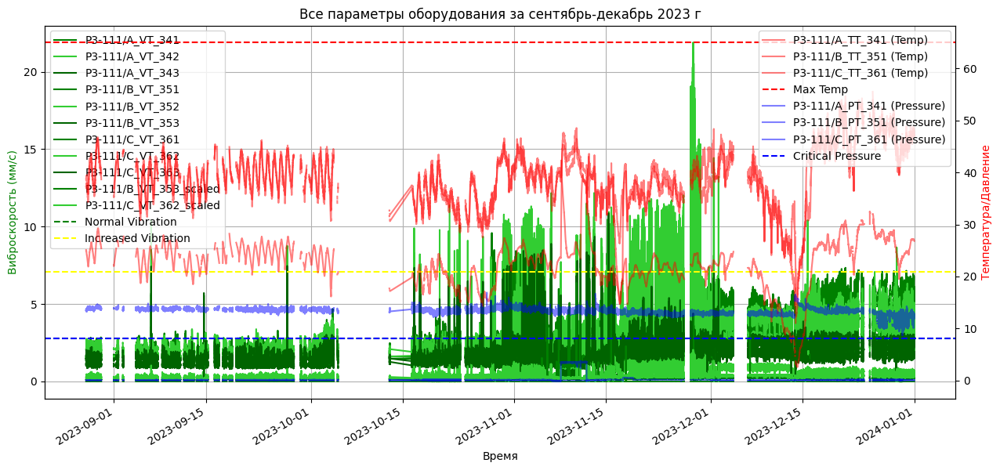

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
# График всех данных группы насосов 111
# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv')
data['time'] = pd.to_datetime(data['time'])  # Убедимся, что колонка с временем в правильном формате

# Настройки уставок
normal_vibration = 2.8
increased_vibration = 7.1
max_temp = 65  # максимально допустимая температура
max_pressure = 8.1

# Настройка визуализации
fig, ax1 = plt.subplots(figsize=(15, 7))

# Построение графика для каждого датчика виброскорости (VT)
colors = ['green', 'limegreen', 'darkgreen']  # разные оттенки зеленого для виброскорости
vibration_sensors = [col for col in data.columns if 'VT' in col]
for i, col in enumerate(vibration_sensors):
    ax1.plot(data['time'], data[col], label=f"{col}", color=colors[i % len(colors)])

# Добавление уставок виброскорости
ax1.axhline(y=normal_vibration, color='green', linestyle='--', label='Normal Vibration')
ax1.axhline(y=increased_vibration, color='yellow', linestyle='--', label='Increased Vibration')

# Ось для температуры (TT)
ax2 = ax1.twinx()
temperature_sensors = [col for col in data.columns if 'TT' in col]
for col in temperature_sensors:
    ax2.plot(data['time'], data[col], label=f"{col} (Temp)", color='red', alpha=0.5)

# Добавление уставок температуры
ax2.axhline(y=max_temp, color='red', linestyle='--', label='Max Temp')

# Ось для давления (PT)
pressure_sensors = [col for col in data.columns if 'PT' in col]
for col in pressure_sensors:
    ax2.plot(data['time'], data[col], label=f"{col} (Pressure)", color='blue', alpha=0.5)

# Добавление уставок давления
ax2.axhline(y=max_pressure, color='blue', linestyle='--', label='Critical Pressure')

# Настройки осей
ax1.set_title('Все параметры оборудования за сентябрь-декабрь 2023 г')
ax1.set_xlabel('Время')
ax1.set_ylabel('Виброскорость (мм/с)', color='green')
ax2.set_ylabel('Температура/Давление', color='red')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.grid(True)

# Форматирование даты на оси X
plt.gcf().autofmt_xdate()

# Показать график
plt.show()


**Посмотрим теперь на зависимость изменений в темпаратуре и вибрации на насосе**

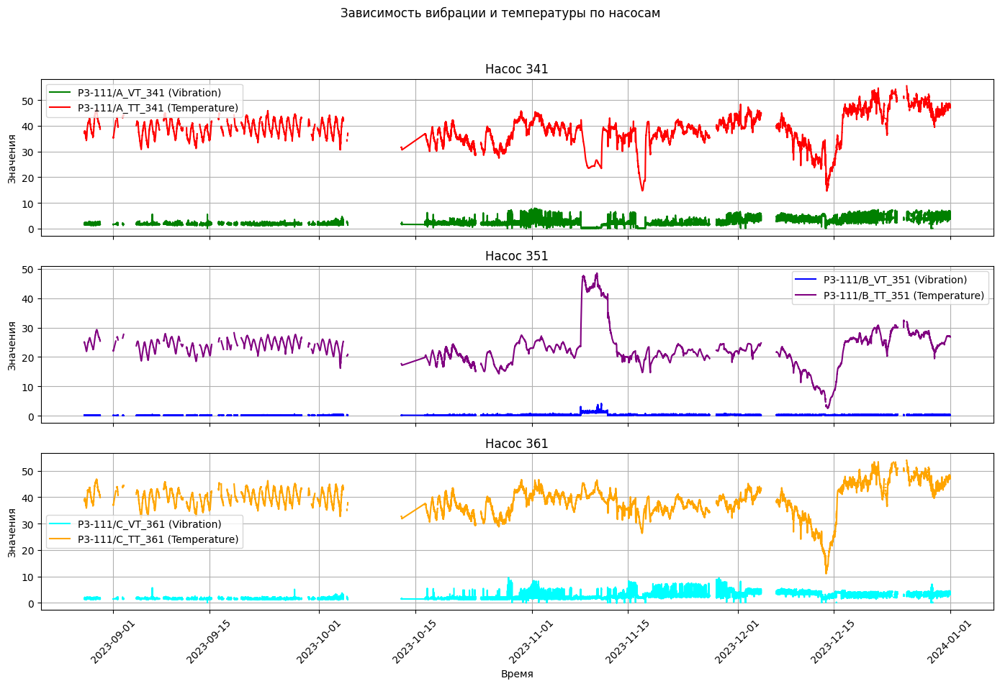

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv')
data['time'] = pd.to_datetime(data['time'])
data.sort_values('time', inplace=True)

# Подготовка к визуализации
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)
fig.suptitle('Зависимость вибрации и температуры по насосам')

# Насос 341
axes[0].plot(data['time'], data['P3-111/A_VT_341'], label='P3-111/A_VT_341 (Vibration)', color='green')
axes[0].plot(data['time'], data['P3-111/A_TT_341'], label='P3-111/A_TT_341 (Temperature)', color='red')
axes[0].set_title('Насос 341')
axes[0].legend()

# Насос 351
axes[1].plot(data['time'], data['P3-111/B_VT_351'], label='P3-111/B_VT_351 (Vibration)', color='blue')
axes[1].plot(data['time'], data['P3-111/B_TT_351'], label='P3-111/B_TT_351 (Temperature)', color='purple')
axes[1].set_title('Насос 351')
axes[1].legend()

# Насос 361
axes[2].plot(data['time'], data['P3-111/C_VT_361'], label='P3-111/C_VT_361 (Vibration)', color='cyan')
axes[2].plot(data['time'], data['P3-111/C_TT_361'], label='P3-111/C_TT_361 (Temperature)', color='orange')
axes[2].set_title('Насос 361')
axes[2].legend()

# Настройка осей
for ax in axes:
    ax.set_ylabel('Значения')
    ax.grid(True)

plt.xlabel('Время')
plt.xticks(rotation=45)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


**Тут два нормальных режима, так как есть режим включения двигателя резервного насоса 351 на замену двигателя насоса 341 в период 1-11 ноября 2023**

In [ ]:
# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv')
print(df.columns)

Index(['time', 'P3-111/A_PT_341', 'P3-111/A_TT_341', 'P3-111/A_VT_341',
       'P3-111/A_VT_342', 'P3-111/A_VT_343', 'P3-111/B_PT_351',
       'P3-111/B_TT_351', 'P3-111/B_VT_351', 'P3-111/B_VT_352',
       'P3-111/B_VT_353', 'P3-111/C_PT_361', 'P3-111/C_TT_361',
       'P3-111/C_VT_361', 'P3-111/C_VT_363', 'P3-111/C_VT_362_scaled'],
      dtype='object')


**Задание по кластеризации аномалий**

C:\Users\Admin\AppData\Local\Temp\ipykernel_13216\470146932.py:94: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\Admin\Desktop\myenv3.10\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


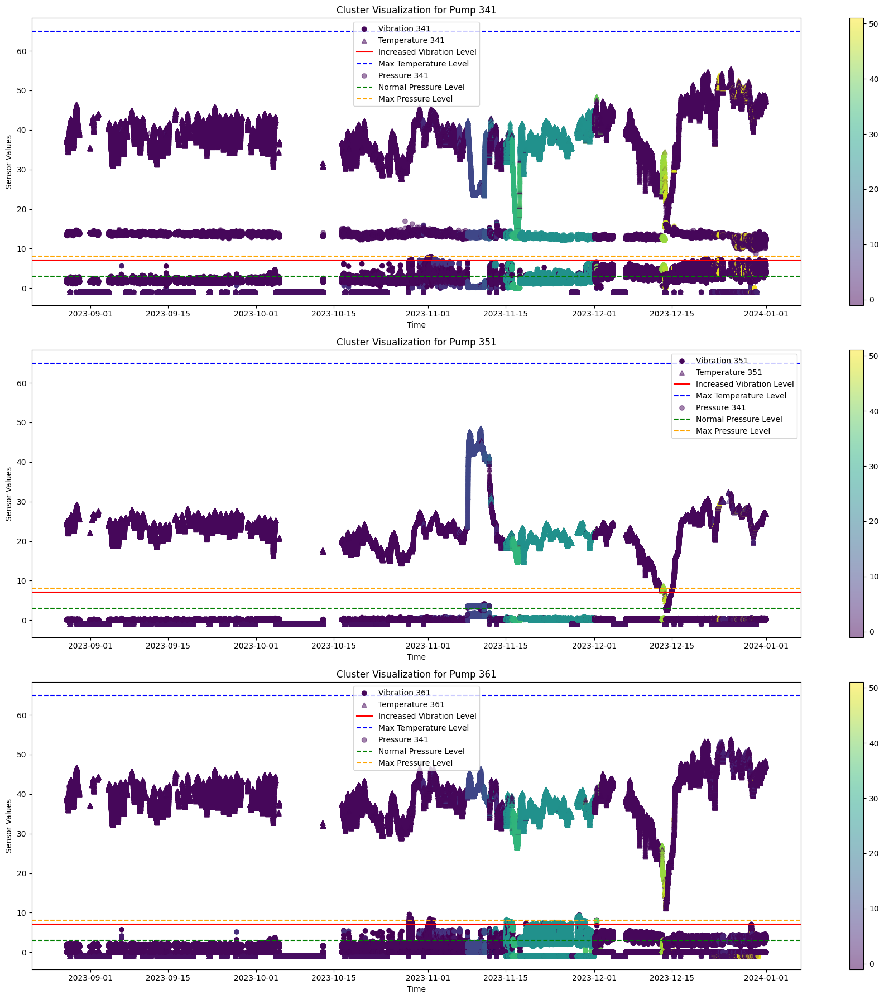

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv')
df['time'] = pd.to_datetime(df['time'])
df.sort_values('time', inplace=True)

# Замена NaN на специальное значение, которое явно выходит за пределы обычных значений датчика
df.fillna(-1, inplace=True)

# Выбор признаков для кластеризации
features = df[['P3-111/A_PT_341', 'P3-111/A_TT_341', 'P3-111/A_VT_341',
            'P3-111/A_VT_342', 'P3-111/A_VT_343', 'P3-111/B_PT_351',
            'P3-111/B_TT_351', 'P3-111/B_VT_351', 'P3-111/B_VT_352',
            'P3-111/B_VT_353', 'P3-111/C_PT_361', 'P3-111/C_TT_361',
            'P3-111/C_VT_361', 'P3-111/C_VT_363', 'P3-111/C_VT_362_scaled']]

# Нормализация данных
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Применение DBSCAN для кластеризации
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(features_scaled)

# Добавление результатов кластеризации в DataFrame
df['cluster'] = clusters

# Сохранение результатов в файл
df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353_clusters.csv', index=False)

# Уставки для вибрации и температуры
normal_vibration = 2.8
increased_vibration = 7.1
normal_temp = 60
max_temp = 65
normal_pressure = 3
max_pressure = 8.1

# Настройка фигуры для отображения результатов кластеризации для трех насосов
plt.figure(figsize=(18, 18))

# Насос 341
plt.subplot(3, 1, 1)
plt.scatter(df['time'], df['P3-111/A_VT_341'], c=df['cluster'], cmap='viridis', label='Vibration 341', marker='o')
plt.scatter(df['time'], df['P3-111/A_TT_341'], c=df['cluster'], cmap='viridis', alpha=0.5, label='Temperature 341', marker='^')
plt.axhline(y=increased_vibration, color='r', linestyle='-', label='Increased Vibration Level')
plt.axhline(y=max_temp, color='b', linestyle='--', label='Max Temperature Level')
plt.scatter(df['time'], df['P3-111/A_PT_341'], c=df['cluster'], cmap='viridis', alpha=0.5, label='Pressure 341')
plt.axhline(y=normal_pressure, color='g', linestyle='--', label='Normal Pressure Level')
plt.axhline(y=max_pressure, color='orange', linestyle='--', label='Max Pressure Level')
plt.colorbar()
plt.title('Cluster Visualization for Pump 341')
plt.xlabel('Time')
plt.ylabel('Sensor Values')
plt.legend()

# Насос 351
plt.subplot(3, 1, 2)
plt.scatter(df['time'], df['P3-111/B_VT_351'], c=df['cluster'], cmap='viridis', label='Vibration 351', marker='o')
plt.scatter(df['time'], df['P3-111/B_TT_351'], c=df['cluster'], cmap='viridis', alpha=0.5, label='Temperature 351', marker='^')
plt.axhline(y=increased_vibration, color='r', linestyle='-', label='Increased Vibration Level')
plt.axhline(y=max_temp, color='b', linestyle='--', label='Max Temperature Level')
plt.scatter(df['time'], df['P3-111/B_PT_351'], c=df['cluster'], cmap='viridis', alpha=0.5, label='Pressure 341')
plt.axhline(y=normal_pressure, color='g', linestyle='--', label='Normal Pressure Level')
plt.axhline(y=max_pressure, color='orange', linestyle='--', label='Max Pressure Level')

plt.colorbar()
plt.title('Cluster Visualization for Pump 351')
plt.xlabel('Time')
plt.ylabel('Sensor Values')
plt.legend()

# Насос 361
plt.subplot(3, 1, 3)
plt.scatter(df['time'], df['P3-111/C_VT_361'], c=df['cluster'], cmap='viridis', label='Vibration 361', marker='o')
plt.scatter(df['time'], df['P3-111/C_TT_361'], c=df['cluster'], cmap='viridis', alpha=0.5, label='Temperature 361', marker='^')
plt.axhline(y=increased_vibration, color='r', linestyle='-', label='Increased Vibration Level')
plt.axhline(y=max_temp, color='b', linestyle='--', label='Max Temperature Level')
plt.scatter(df['time'], df['P3-111/C_PT_361'], c=df['cluster'], cmap='viridis', alpha=0.5, label='Pressure 341')
plt.axhline(y=normal_pressure, color='g', linestyle='--', label='Normal Pressure Level')
plt.axhline(y=max_pressure, color='orange', linestyle='--', label='Max Pressure Level')

plt.colorbar()
plt.title('Cluster Visualization for Pump 361')
plt.xlabel('Time')
plt.ylabel('Sensor Values')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# посмотрим. сколько всего кластеров
print(df['cluster'].value_counts())


cluster
 0     105195
 1      41199
 25     19227
 10      4214
 33      1772
 13      1309
 43       695
 4        658
-1        471
 32       223
 49       211
 5        178
 6        122
 28       120
 23       117
 7        100
 35        97
 9         65
 26        54
 19        47
 45        47
 47        45
 42        35
 21        35
 12        32
 44        18
 40        17
 31        16
 2         16
 39        13
 48        12
 46        10
 27        10
 14        10
 16        10
 20         9
 17         9
 8          9
 36         9
 37         9
 11         6
 51         6
 24         6
 41         5
 30         5
 18         5
 22         5
 38         5
 15         5
 3          5
 34         5
 29         5
 50         4
Name: count, dtype: int64


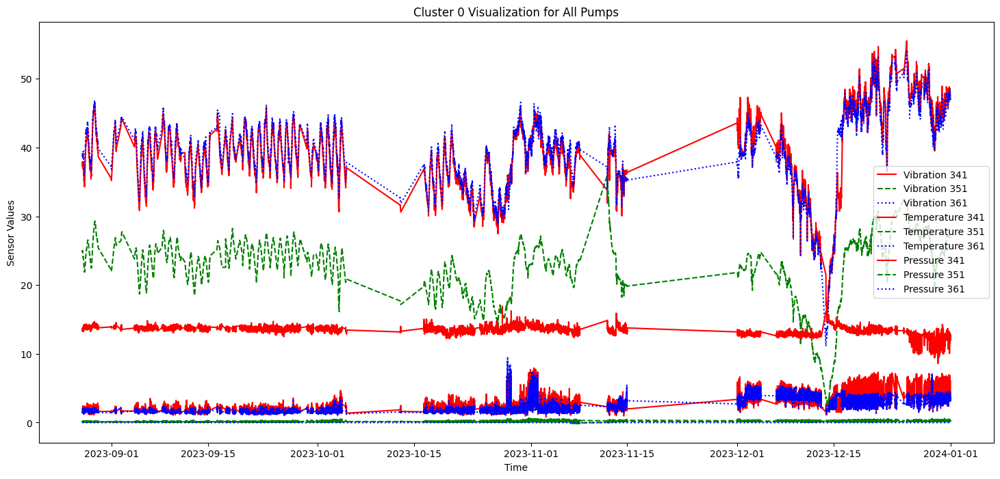

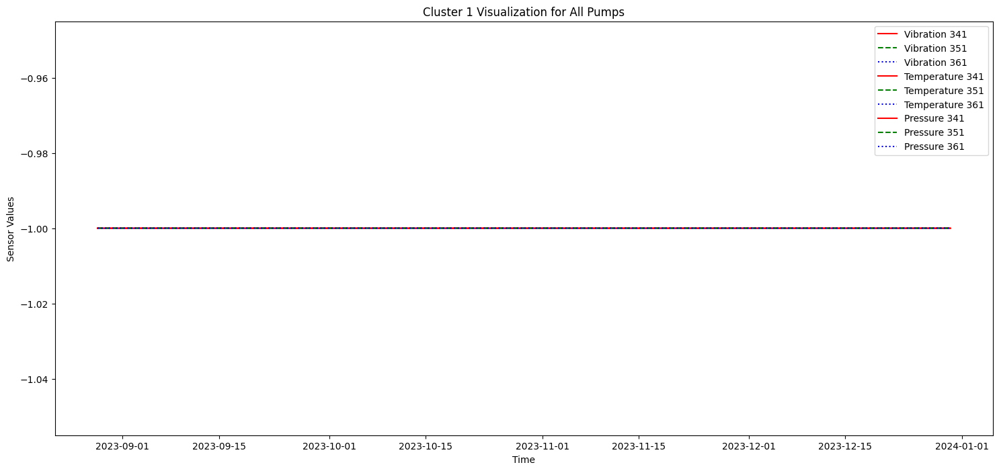

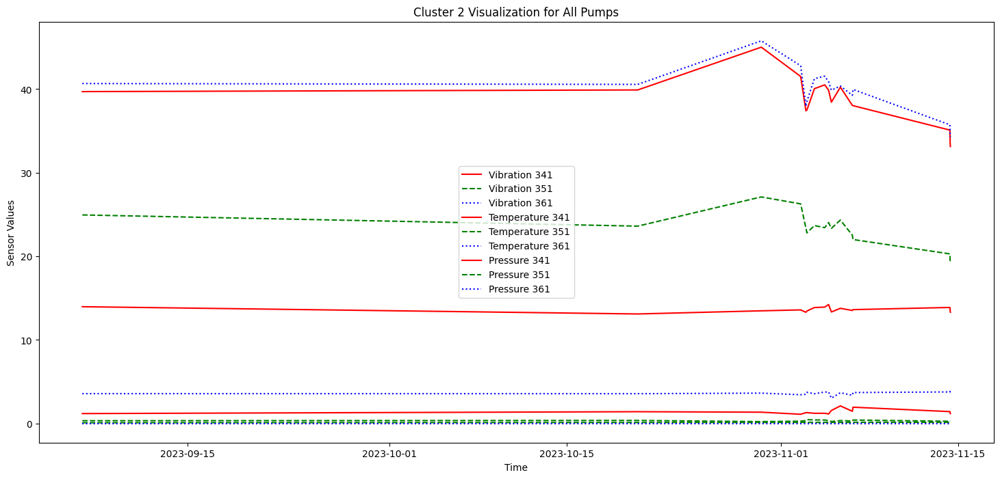

In [ ]:
# теперь посмотрим, что там, внутри этих кластеров. Кластеры 1-3
import matplotlib.pyplot as plt

# Построение графика для нескольких параметров в одном кластере
# Настройка фигуры для отображения результатов кластеризации
plt.figure(figsize=(18, 8))

# Кластер 0. Вибрация для всех трех насосов
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/A_VT_341'][df['cluster'] == 0], 'r-', label='Vibration 341')
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/B_VT_351'][df['cluster'] == 0], 'g--', label='Vibration 351')
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/C_VT_361'][df['cluster'] == 0], 'b:', label='Vibration 361')

# Кластер 2. Температура для всех трех насосов
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/A_TT_341'][df['cluster'] == 0], 'r-', label='Temperature 341')
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/B_TT_351'][df['cluster'] == 0], 'g--', label='Temperature 351')
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/C_TT_361'][df['cluster'] == 0], 'b:', label='Temperature 361')

# Кластер 2. Давление для всех трех насосов
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/A_PT_341'][df['cluster'] == 0], 'r-', label='Pressure 341')
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/B_PT_351'][df['cluster'] == 0], 'g--', label='Pressure 351')
plt.plot(df['time'][df['cluster'] == 0], df['P3-111/C_PT_361'][df['cluster'] == 0], 'b:', label='Pressure 361')

plt.title('Cluster 0 Visualization for All Pumps')
plt.xlabel('Time')
plt.ylabel('Sensor Values')
plt.legend()
plt.show()

# Настройка фигуры для отображения результатов кластеризации
plt.figure(figsize=(18, 8))

# Кластер 2. Вибрация для всех трех насосов
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/A_VT_341'][df['cluster'] == 1], 'r-', label='Vibration 341')
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/B_VT_351'][df['cluster'] == 1], 'g--', label='Vibration 351')
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/C_VT_361'][df['cluster'] == 1], 'b:', label='Vibration 361')

# Кластер 2. Температура для всех трех насосов
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/A_TT_341'][df['cluster'] == 1], 'r-', label='Temperature 341')
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/B_TT_351'][df['cluster'] == 1], 'g--', label='Temperature 351')
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/C_TT_361'][df['cluster'] == 1], 'b:', label='Temperature 361')

# Кластер 2. Давление для всех трех насосов
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/A_PT_341'][df['cluster'] == 1], 'r-', label='Pressure 341')
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/B_PT_351'][df['cluster'] == 1], 'g--', label='Pressure 351')
plt.plot(df['time'][df['cluster'] == 1], df['P3-111/C_PT_361'][df['cluster'] == 1], 'b:', label='Pressure 361')

plt.title('Cluster 1 Visualization for All Pumps')
plt.xlabel('Time')
plt.ylabel('Sensor Values')
plt.legend()
plt.show()



# Настройка фигуры для отображения результатов кластеризации
plt.figure(figsize=(18, 8))

# Кластер 2. Вибрация для всех трех насосов
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/A_VT_341'][df['cluster'] == 2], 'r-', label='Vibration 341')
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/B_VT_351'][df['cluster'] == 2], 'g--', label='Vibration 351')
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/C_VT_361'][df['cluster'] == 2], 'b:', label='Vibration 361')

# Кластер 2. Температура для всех трех насосов
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/A_TT_341'][df['cluster'] == 2], 'r-', label='Temperature 341')
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/B_TT_351'][df['cluster'] == 2], 'g--', label='Temperature 351')
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/C_TT_361'][df['cluster'] == 2], 'b:', label='Temperature 361')

# Кластер 2. Давление для всех трех насосов
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/A_PT_341'][df['cluster'] == 2], 'r-', label='Pressure 341')
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/B_PT_351'][df['cluster'] == 2], 'g--', label='Pressure 351')
plt.plot(df['time'][df['cluster'] == 2], df['P3-111/C_PT_361'][df['cluster'] == 2], 'b:', label='Pressure 361')

plt.title('Cluster 2 Visualization for All Pumps')
plt.xlabel('Time')
plt.ylabel('Sensor Values')
plt.legend()
plt.show()


**Кластер 0 - "Нормальный режим", кластер 1 - "Датчик не работает", кластер 2 "Включение резервного насоса"**
**Автоматизируем визуализацию кластеров, чтобы разобраться, а что там дальше.**

In [ ]:
import matplotlib.pyplot as plt

def visualize_all_clusters(df):
    # Уникальные кластеры
    unique_clusters = df['cluster'].unique()

    # Настройка фигуры для отображения результатов кластеризации
    plt.figure(figsize=(18, 8 * len(unique_clusters)))

    # Построение графиков для каждого кластера
    for i, cluster in enumerate(sorted(unique_clusters)):
        plt.subplot(len(unique_clusters), 1, i + 1)

        # Температура для каждого насоса
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/A_TT_341'][df['cluster'] == cluster], 'r-', label='Temperature A')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/B_TT_351'][df['cluster'] == cluster], 'r:*', label='Temperature B')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/C_TT_361'][df['cluster'] == cluster], 'r--x', label='Temperature C')

        # Давление для каждого насоса
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/A_PT_341'][df['cluster'] == cluster], 'y-', label='Pressure A')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/B_PT_351'][df['cluster'] == cluster], 'y:*', label='Pressure B')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/C_PT_361'][df['cluster'] == cluster], 'y--x', label='Pressure C')

        # Вибрация основного датчика на каждом насосе
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/A_VT_341'][df['cluster'] == cluster], 'b-', label='Main Vibration A')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/B_VT_351'][df['cluster'] == cluster], 'b:*', label='Main Vibration B')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/C_VT_361'][df['cluster'] == cluster], 'b--x', label='Main Vibration C')

        # Вибрация дополнительных датчиков на улитках насоса (342, 352, 362)
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/A_VT_342'][df['cluster'] == cluster], 'c-', label='Bearing Vibration A 342')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/B_VT_352'][df['cluster'] == cluster], 'c:*', label='Bearing Vibration B 352')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/C_VT_362_scaled'][df['cluster'] == cluster], 'c--x', label='Bearing Vibration C 362')

        # Вибрация дополнительных датчиков на улитках насоса (343, 353, 363)
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/A_VT_343'][df['cluster'] == cluster], 'm-', label='Bearing Vibration A 343')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/B_VT_353'][df['cluster'] == cluster], 'm:*', label='Bearing Vibration B 353')
        plt.plot(df['time'][df['cluster'] == cluster], df['P3-111/C_VT_363'][df['cluster'] == cluster], 'm--x', label='Bearing Vibration C 363')

        plt.title(f'Cluster {cluster} Visualization for All Pumps')
        plt.xlabel('Time')
        plt.ylabel('Sensor Values')
        plt.legend()

    plt.tight_layout()
    plt.show()


visualize_all_clusters(df)



**Проанализируем кластеры и сохраним о них информацию**

In [ ]:
import pandas as pd

def analyze_clusters(df):
    # Уникальные кластеры
    clusters = df['cluster'].unique()
    # Создание DataFrame для агрегированных данных
    cluster_descriptions = []

    # Анализ каждого кластера
    for cluster in clusters:
        cluster_data = df[df['cluster'] == cluster]
        # Вычисление статистик для каждой колонки
        for column in cluster_data.columns:
            if column not in ['time', 'cluster']:  # Исключаем колонки time и cluster
                desc = cluster_data[column].describe(percentiles=[.25, .5, .75])
                stats = {
                    'Cluster': cluster,
                    'Sensor': column,
                    'Count': desc['count'],
                    'Mean': desc['mean'],
                    'STD': desc['std'],
                    'Min': desc['min'],
                    '25%': desc['25%'],
                    '50%': desc['50%'],  # Медиана
                    '75%': desc['75%'],
                    'Max': desc['max']
                }
                cluster_descriptions.append(stats)

    # Преобразование списка словарей в DataFrame
    result_df = pd.DataFrame(cluster_descriptions)
    return result_df


cluster_stats = analyze_clusters(df)

# Сохранение результатов в CSV
cluster_stats.to_csv('cluster_descriptions.csv', index=False)
cluster_stats.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_claster_stats.csv', index=False)

In [ ]:
cluster_stats.head()

,Cluster,Sensor,Count,Mean,STD,Min,25%,50%,75%,Max
0,0,P3-111/A_PT_341,105195.0,13.458005,0.597629,8.591906,13.172111,13.554379,13.802327,16.903008
1,0,P3-111/A_TT_341,105195.0,38.907951,5.723369,14.598825,35.600662,39.081823,42.529816,55.515110
2,0,P3-111/A_VT_341,105195.0,2.630213,1.237072,0.802360,1.718992,2.171929,3.140370,7.924382
3,0,P3-111/A_VT_342,105195.0,2.026834,0.592684,0.826228,1.592592,1.851674,2.339769,5.981265
4,0,P3-111/A_VT_343,105195.0,1.478564,0.524951,0.590243,1.122120,1.398602,1.696096,6.317272


**Кластеры с датами**

In [ ]:
import pandas as pd

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353_clusters.csv')
df['time'] = pd.to_datetime(df['time'])

def find_cluster_events(df):
    event_list = []
    clusters = df['cluster'].unique()

    # Исключаем кластеры 0 и 1 из анализа
    clusters = [c for c in clusters if c not in [0, 1]]

    for cluster in clusters:
        cluster_data = df[df['cluster'] == cluster]
        cluster_data = cluster_data.sort_values(by='time')

        # Определение изменений в кластере
        changes = cluster_data['cluster'].diff().fillna(1) != 0  # Начало нового сегмента
        cluster_data['segment_start'] = changes
        cluster_data['segment_end'] = changes.shift(-1, fill_value=True)  # Конец сегмента

        # Извлекаем начальные и конечные точки
        start_times = cluster_data[cluster_data['segment_start']]['time']
        end_times = cluster_data[cluster_data['segment_end']]['time']

        for start, end in zip(start_times, end_times):
            event_list.append({
                'Cluster': cluster,
                'Start': start,
                'End': end
            })

    return pd.DataFrame(event_list)

# Применяем функцию
cluster_events = find_cluster_events(df)

# Проверяем и выводим результаты
print("События по кластерам:")
print(cluster_events.head())

# Сохраняем события в CSV
cluster_events.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\cluster_events.csv', index=False)

События по кластерам:
   Cluster               Start                 End
0        2 2023-09-06 16:07:00 2023-11-14 09:41:00
1       -1 2023-09-06 16:08:00 2023-12-30 01:52:00
2        3 2023-09-06 16:09:00 2023-11-03 07:27:00
3        4 2023-09-08 08:27:00 2023-12-30 07:40:00
4        5 2023-09-14 16:45:00 2023-12-29 10:51:00


**Сгруппируем кдастеры**

In [ ]:
import pandas as pd

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353_clusters.csv')

# Словарь для переназначения кластеров
cluster_reassignment = {i: 9 for i in range(9, 37)}
cluster_reassignment.update({i: 10 for i in range(37, 42)})
cluster_reassignment.update({i: 11 for i in range(42, 49)})
cluster_reassignment.update({50: 12, 51: 13})

# Оставляем существующие метки для кластеров до 8 и для -1
cluster_reassignment.update({i: i for i in range(-1, 9)})

# Применяем переназначение кластеров
df['cluster'] = df['cluster'].map(cluster_reassignment)

# Сохраняем результат в новый файл
df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_clusters_reassigned.csv', index=False)


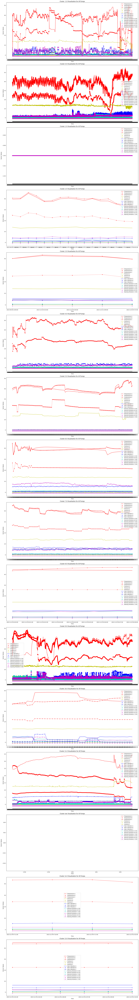

In [ ]:
visualize_all_clusters(df)

**Насколько кластеры выходят за уставки?**

In [ ]:
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_clusters_reassigned.csv')
print(df.columns)

Index(['time', 'P3-111/A_PT_341', 'P3-111/A_TT_341', 'P3-111/A_VT_341',
       'P3-111/A_VT_342', 'P3-111/A_VT_343', 'P3-111/B_PT_351',
       'P3-111/B_TT_351', 'P3-111/B_VT_351', 'P3-111/B_VT_352',
       'P3-111/B_VT_353', 'P3-111/C_PT_361', 'P3-111/C_TT_361',
       'P3-111/C_VT_361', 'P3-111/C_VT_363', 'P3-111/C_VT_362_scaled',
       'cluster'],
      dtype='object')


In [ ]:
import pandas as pd

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_clusters_reassigned.csv')

# Уставки
temp_normal_max = 60
temp_critical_max = 65
vibration_normal_max = 2.8
vibration_high_max = 7.1
pressure_normal_max = 3
pressure_critical_max = 8.1

# Функция для расчета процента превышения уставок
def calculate_over_limits(df, cluster):
    data = df[df['cluster'] == cluster]
    result = {
        'cluster': cluster,
        'temp_above_60': (data[['P3-111/A_TT_341', 'P3-111/B_TT_351', 'P3-111/C_TT_361']] > temp_normal_max).mean().mean() * 100,
        'temp_above_65': (data[['P3-111/A_TT_341', 'P3-111/B_TT_351', 'P3-111/C_TT_361']] > temp_critical_max).mean().mean() * 100,
        'vibration_above_2.8': (data[['P3-111/A_VT_341', 'P3-111/A_VT_342', 'P3-111/A_VT_343', 'P3-111/B_VT_351', 'P3-111/B_VT_352', 'P3-111/B_VT_353', 'P3-111/C_VT_361', 'P3-111/C_VT_362_scaled', 'P3-111/C_VT_363']] > vibration_normal_max).mean().mean() * 100,
        'vibration_above_7.1': (data[['P3-111/A_VT_341', 'P3-111/A_VT_342', 'P3-111/A_VT_343', 'P3-111/B_VT_351', 'P3-111/B_VT_352', 'P3-111/B_VT_353', 'P3-111/C_VT_361', 'P3-111/C_VT_362_scaled', 'P3-111/C_VT_363']] > vibration_high_max).mean().mean() * 100,
        'pressure_above_3': (data[['P3-111/A_PT_341', 'P3-111/B_PT_351', 'P3-111/C_PT_361']] > pressure_normal_max).mean().mean() * 100,
        'pressure_above_8.1': (data[['P3-111/A_PT_341', 'P3-111/B_PT_351', 'P3-111/C_PT_361']] > pressure_critical_max).mean().mean() * 100
    }
    return result

# Применение функции для каждого кластера
clusters = df['cluster'].unique()
over_limits = pd.DataFrame([calculate_over_limits(df, cluster) for cluster in clusters])

# Сохранение результатов
over_limits.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\cluster_over_limits.csv', index=False)


In [ ]:
import pandas as pd

# Путь к файлу с данными по кластерам
file_path = r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_clusters_reassigned.csv'

# Загрузка данных
df = pd.read_csv(file_path)

# Конвертация колонки 'time' в формат datetime, если она еще не в таком формате
df['time'] = pd.to_datetime(df['time'])

# Группировка по кластерам и получение минимальной и максимальной даты для каждого кластера
cluster_dates = df.groupby('cluster')['time'].agg(['min', 'max'])

# Вывод информации о датах для каждого кластера
cluster_dates


,min,max
cluster,,
-1.0,2023-09-06 16:08:00,2023-12-30 01:52:00
0.0,2023-08-27 18:06:00,2023-12-31 23:59:00
1.0,2023-08-28 08:37:00,2023-12-30 05:31:00
2.0,2023-09-06 16:07:00,2023-11-14 09:41:00
3.0,2023-09-06 16:09:00,2023-11-03 07:27:00
4.0,2023-09-08 08:27:00,2023-12-30 07:40:00
5.0,2023-09-14 16:45:00,2023-12-29 10:51:00
6.0,2023-09-27 09:51:00,2023-11-06 17:37:00
7.0,2023-10-30 09:42:00,2023-11-13 04:36:00


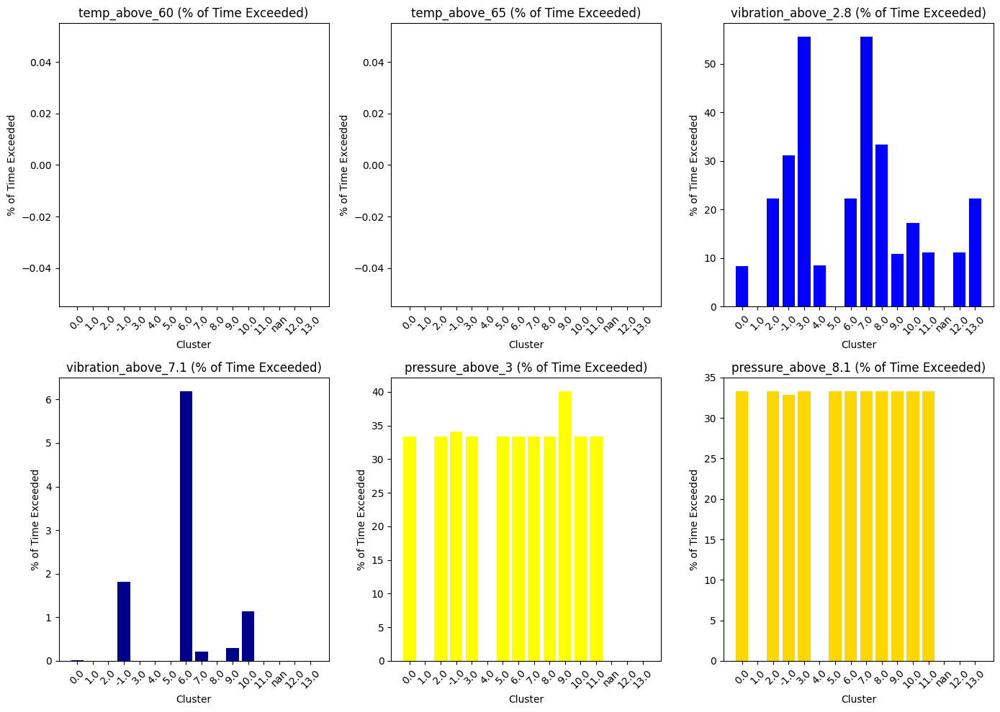

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\cluster_over_limits.csv')

# Настройка визуализации
plt.figure(figsize=(14, 10))

# Названия столбцов и их цвета для диаграммы
columns = ['temp_above_60', 'temp_above_65', 'vibration_above_2.8', 'vibration_above_7.1', 'pressure_above_3', 'pressure_above_8.1']
colors = ['red', 'darkred', 'blue', 'darkblue', 'yellow', 'gold']

# Построение диаграмм для каждого параметра
for i, column in enumerate(columns):
    plt.subplot(2, 3, i + 1)
    plt.bar(data['cluster'].astype(str), data[column], color=colors[i])
    plt.title(f'{column} (% of Time Exceeded)')
    plt.xlabel('Cluster')
    plt.ylabel('% of Time Exceeded')
    plt.xticks(rotation=45)  # Поворот меток на оси X для лучшей читаемости

plt.tight_layout()
plt.show()


**Описание объединенных кластеров**

In [ ]:
import pandas as pd

df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_clusters_reassigned.csv')
df['time'] = pd.to_datetime(df['time'])  # Конвертация времени

def analyze_clusters(df):
    # Уникальные кластеры
    clusters = df['cluster'].unique()
    # Создание DataFrame для агрегированных данных
    cluster_descriptions2 = []

    # Анализ каждого кластера
    for cluster in clusters:
        cluster_data = df[df['cluster'] == cluster]
        # Вычисление статистик для каждой колонки
        for column in cluster_data.columns:
            if column not in ['time', 'cluster']:  # Исключаем колонки time и cluster
                desc = cluster_data[column].describe(percentiles=[.25, .5, .75])
                stats = {
                    'Cluster': cluster,
                    'Sensor': column,
                    'Count': desc['count'],
                    'Mean': desc['mean'],
                    'STD': desc['std'],
                    'Min': desc['min'],
                    '25%': desc['25%'],
                    '50%': desc['50%'],  # Медиана
                    '75%': desc['75%'],
                    'Max': desc['max']
                }
                cluster_descriptions2.append(stats)

    # Преобразование списка словарей в DataFrame
    result_df = pd.DataFrame(cluster_descriptions2)
    return result_df


cluster_stats = analyze_clusters(df)

# Сохранение результатов в CSV
cluster_stats.to_csv('cluster_descriptions2.csv', index=False)
cluster_stats.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_claster_stats2.csv', index=False)

**Выходят за критические уставки вибрации кластеры -1, 7,9, очень сильно - 10, за повышенное давление 1,0,2,3,5,6,7,8,9,10,11,12, 13, за критическое давление -1,0,2,3,5,6,7,8,9,10,11.**

**Посмотрим, что происходит во время промывки насосов на ТО**

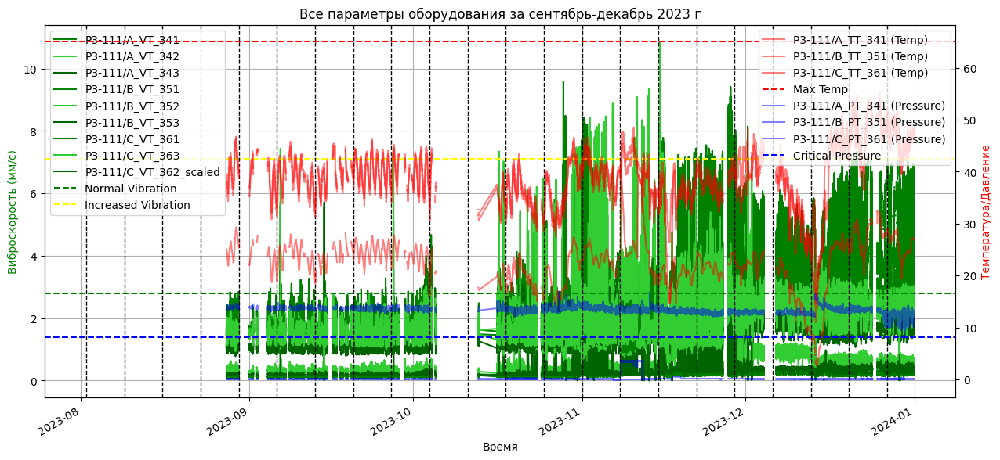

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Данные для загрузки
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv')
data['time'] = pd.to_datetime(data['time'])  # Конвертация времени

# Уставки
normal_vibration = 2.8
increased_vibration = 7.1
max_temp = 65
max_pressure = 8.1

# Даты технического обслуживания
maintenance_dates = [
    "2023-08-02", "2023-08-09", "2023-08-16", "2023-08-23", "2023-08-30",
    "2023-09-06", "2023-09-13", "2023-09-20", "2023-09-27",
    "2023-10-04", "2023-10-11", "2023-10-18", "2023-10-25",
    "2023-11-01", "2023-11-08", "2023-11-15", "2023-11-22", "2023-11-29",
    "2023-12-06", "2023-12-13", "2023-12-20", "2023-12-27"
]

# Создание графика
fig, ax1 = plt.subplots(figsize=(15, 7))

# Визуализация данных виброскорости
colors = ['green', 'limegreen', 'darkgreen']  # разные оттенки зеленого для виброскорости
vibration_sensors = [col for col in data.columns if 'VT' in col]
for i, col in enumerate(vibration_sensors):
    ax1.plot(data['time'], data[col], label=f"{col}", color=colors[i % len(colors)])

# Добавление уставок виброскорости
ax1.axhline(y=normal_vibration, color='green', linestyle='--', label='Normal Vibration')
ax1.axhline(y=increased_vibration, color='yellow', linestyle='--', label='Increased Vibration')

# Ось для температуры (двойная ось Y)
ax2 = ax1.twinx()
temperature_sensors = [col for col in data.columns if 'TT' in col]
for col in temperature_sensors:
    ax2.plot(data['time'], data[col], label=f"{col} (Temp)", color='red', alpha=0.5)

# Добавление уставок температуры
ax2.axhline(y=max_temp, color='red', linestyle='--', label='Max Temp')

# Ось для давления (PT)
pressure_sensors = [col for col in data.columns if 'PT' in col]
for col in pressure_sensors:
    ax2.plot(data['time'], data[col], label=f"{col} (Pressure)", color='blue', alpha=0.5)

# Добавление уставок давления
ax2.axhline(y=max_pressure, color='blue', linestyle='--', label='Critical Pressure')

# Добавление вертикальных линий для дат технического обслуживания
for date in maintenance_dates:
    ax1.axvline(pd.to_datetime(date), color='black', linestyle='--', linewidth=1)

# Дополнительные настройки графика
ax1.set_title('Все параметры оборудования за сентябрь-декабрь 2023 г')
ax1.set_xlabel('Время')
ax1.set_ylabel('Виброскорость (мм/с)', color='green')
ax2.set_ylabel('Температура/Давление', color='red')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.grid(True)

# Форматирование даты на оси X
plt.gcf().autofmt_xdate()

# Показать график
plt.show()


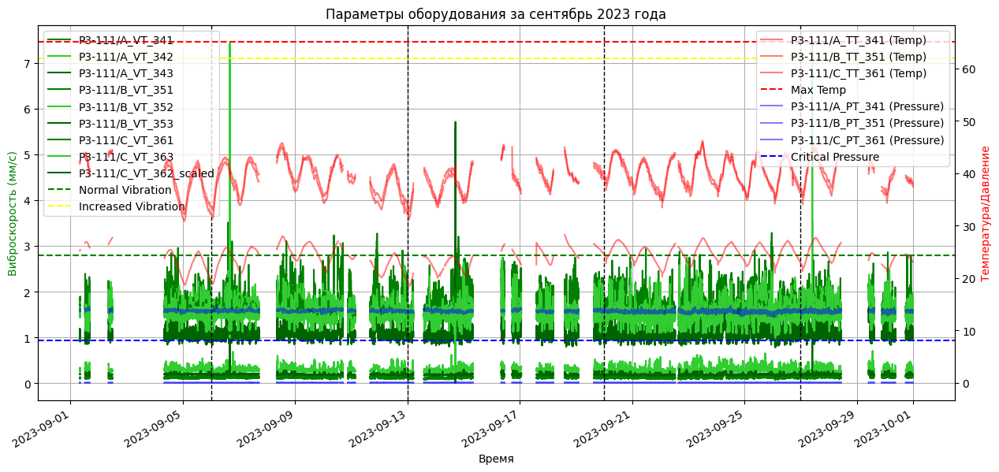

In [ ]:
#Уменьшим график до одного месячца.
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scaled_no353.csv')
data['time'] = pd.to_datetime(data['time'])  # Конвертация времени

# Фильтрация данных за сентябрь 2023 года
data = data[(data['time'] >= '2023-09-01') & (data['time'] < '2023-10-01')]

# Уставки
normal_vibration = 2.8
increased_vibration = 7.1
max_temp = 65
max_pressure = 8.1

# Даты технического обслуживания в сентябре
maintenance_dates = [
    "2023-09-06", "2023-09-13", "2023-09-20", "2023-09-27"
]

# Создание графика
fig, ax1 = plt.subplots(figsize=(15, 7))

# Визуализация данных виброскорости
colors = ['green', 'limegreen', 'darkgreen']  # разные оттенки зеленого для виброскорости
vibration_sensors = [col for col in data.columns if 'VT' in col]
for i, col in enumerate(vibration_sensors):
    ax1.plot(data['time'], data[col], label=f"{col}", color=colors[i % len(colors)])

# Добавление уставок виброскорости
ax1.axhline(y=normal_vibration, color='green', linestyle='--', label='Normal Vibration')
ax1.axhline(y=increased_vibration, color='yellow', linestyle='--', label='Increased Vibration')

# Ось для температуры (двойная ось Y)
ax2 = ax1.twinx()
temperature_sensors = [col for col in data.columns if 'TT' in col]
for col in temperature_sensors:
    ax2.plot(data['time'], data[col], label=f"{col} (Temp)", color='red', alpha=0.5)

# Добавление уставок температуры
ax2.axhline(y=max_temp, color='red', linestyle='--', label='Max Temp')

# Ось для давления (PT)
pressure_sensors = [col for col in data.columns if 'PT' in col]
for col in pressure_sensors:
    ax2.plot(data['time'], data[col], label=f"{col} (Pressure)", color='blue', alpha=0.5)

# Добавление уставок давления
ax2.axhline(y=max_pressure, color='blue', linestyle='--', label='Critical Pressure')

# Добавление вертикальных линий для дат технического обслуживания
for date in maintenance_dates:
    ax1.axvline(pd.to_datetime(date), color='black', linestyle='--', linewidth=1)

# Дополнительные настройки графика
ax1.set_title('Параметры оборудования за сентябрь 2023 года')
ax1.set_xlabel('Время')
ax1.set_ylabel('Виброскорость (мм/с)', color='green')
ax2.set_ylabel('Температура/Давление', color='red')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax1.grid(True)

# Форматирование даты на оси X
plt.gcf().autofmt_xdate()

# Показать график
plt.show()


**Мы видим, что показатели  падают ровно в даты ТО.**

**Словарь классов режимов работы насосов 111**

In [ ]:
import pandas as pd

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_clusters_reassigned.csv')
data['time'] = pd.to_datetime(data['time'])

# Даты промывки
wash_dates = [
    "2023-08-02", "2023-08-09", "2023-08-16", "2023-08-23", "2023-08-30",
    "2023-09-06", "2023-09-13", "2023-09-20", "2023-09-27",
    "2023-10-04", "2023-10-11", "2023-10-18", "2023-10-25",
    "2023-11-01", "2023-11-08", "2023-11-15", "2023-11-22", "2023-11-29",
    "2023-12-06", "2023-12-13", "2023-12-20", "2023-12-27"
]

# Отметка дней промывки в данных
data['is_wash_day'] = data['time'].dt.date.isin(pd.to_datetime(wash_dates).date)

# Отображение для классов
class_map = {
    0: "normal high pressure",
    1: "sensors out of service",
    2: "normal basic",
    -1: "exclude from analysis",
    3: "alert vibration",
    4: "moderate operation with sensor failures",
    5: "normal operation with occasional pressure peaks",
    6: "monitoring mode",
    7: "enhanced monitoring mode",
    8: "brief operational pauses",
    9: "high operational stress",
    10: "deep fluctuation tt and vt",
    11: "active synchro fluctuation of tt, vt, pt",
    12: "stopping",
    13: "short break"
}

# Присвоение класса с учетом дней промывки
data['class'] = data['cluster'].map(class_map)

# Сохранение обновленных данных
data.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_classified_with_wash.csv', index=False)



In [ ]:
data.head()

,time,P3-111/A_PT_341,P3-111/A_TT_341,P3-111/A_VT_341,P3-111/A_VT_342,P3-111/A_VT_343,P3-111/B_PT_351,P3-111/B_TT_351,P3-111/B_VT_351,P3-111/B_VT_352,P3-111/B_VT_353,P3-111/C_PT_361,P3-111/C_TT_361,P3-111/C_VT_361,P3-111/C_VT_363,P3-111/C_VT_362_scaled,cluster,is_wash_day,class
0,2023-08-27 18:06:00,13.453499,37.298971,1.638024,1.538602,1.163135,0.088069,25.084255,0.116835,0.279895,-1.0,0.0,38.774443,1.471658,1.500135,0.192721,0.0,False,normal high pressure
1,2023-08-27 18:07:00,13.451339,37.337505,1.606807,1.584566,1.095814,0.086433,25.075626,0.094608,0.292370,-1.0,0.0,38.803640,1.505532,1.522777,0.199373,0.0,False,normal high pressure
2,2023-08-27 18:08:00,13.665502,37.369112,1.684209,1.490892,1.014345,0.086214,25.068402,0.131857,0.272030,-1.0,0.0,38.833141,1.452827,1.396867,0.194611,0.0,False,normal high pressure
3,2023-08-27 18:09:00,13.642291,37.394400,1.594963,1.568996,1.004908,0.086777,25.060576,0.108627,0.272512,-1.0,0.0,38.836452,1.452495,1.356737,0.196057,0.0,False,normal high pressure
4,2023-08-27 18:10:00,13.590701,37.397612,1.563321,1.563761,1.054339,0.087255,25.051345,0.115187,0.269249,-1.0,0.0,38.835550,1.461027,1.329851,0.193909,0.0,False,normal high pressure


**Скоринг для режимов. Для скоринга надо было кластеризовать оборудование отдельно, теперь считаем их прямо как группу**

In [ ]:
print(data['class'].unique())

['normal high pressure' 'sensors out of service' 'normal basic'
 'exclude from analysis' 'alert vibration'
 'moderate operation with sensor failures'
 'normal operation with occasional pressure peaks' 'monitoring mode'
 'enhanced monitoring mode' 'brief operational pauses'
 'high operational stress' 'deep fluctuation tt and vt'
 'active synchro fluctuation of tt, vt, pt' nan 'stopping' 'short break']


In [ ]:
import pandas as pd
import numpy as np

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_classified.csv')
data['time'] = pd.to_datetime(data['time'])

# Функция для расчета скоринга
def calculate_scores(df):
    conditions = [
        (df['class'] == 'normal high pressure'),  # Нормальное высокое давление
        (df['class'] == 'sensors out of service'),  # Датчики недоступны
        (df['class'] == 'normal basic'),  # Нормальный базовый режим
        (df['class'] == 'exclude from analysis'),  # Исключено из анализа
        (df['class'] == 'alert vibration'),  # Тревожная вибрация
        (df['class'] == 'moderate operation with sensor failures'),  # Умеренная работа с отказами датчиков
        (df['class'] == 'normal operation with occasional pressure peaks'),  # Нормальная работа с периодическими пиками давления
        (df['class'] == 'monitoring mode'),  # Режим мониторинга
        (df['class'] == 'enhanced monitoring mode'),  # Усиленный режим мониторинга
        (df['class'] == 'brief operational pauses'),  # Краткие операционные паузы
        (df['class'] == 'high operational stress'),  # Высокое операционное напряжение
        (df['class'] == 'deep fluctuation tt and vt'),  # Глубокие колебания температуры и вибрации
        (df['class'] == 'active synchro fluctuation of tt, vt, pt'),  # Активные синхронные колебания температуры, вибрации и давления
        (df['class'] == 'stopping'),  # Остановка
        (df['class'] == 'short break'),  # Короткий перерыв
        (df['class'] == 'wash')  # Промывка
    ]
    scores = [1.5, 2.0, 1.0, 0.0, 0.75, 1.0, 1.0, 0.75, 0.75, 1.25, 0.5, 0.5, 0.5, 1.75, 1.75, 0.1]  # Баллы для каждого режима, промывке присвоен низкий балл
    df['score'] = np.select(conditions, scores, default=1)
    return df

# Расчет скоринга для всех насосов как для одного оборудования
data_with_scores = calculate_scores(data)

# Сохранение результатов
data_with_scores.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scoring.csv', index=False)


In [ ]:
# Считаем общую сумму баллов
total_score = data_with_scores['score'].sum()

# Выводим результат в консоль
print("Общая сумма баллов:", total_score)


Общая сумма баллов: 223176.75


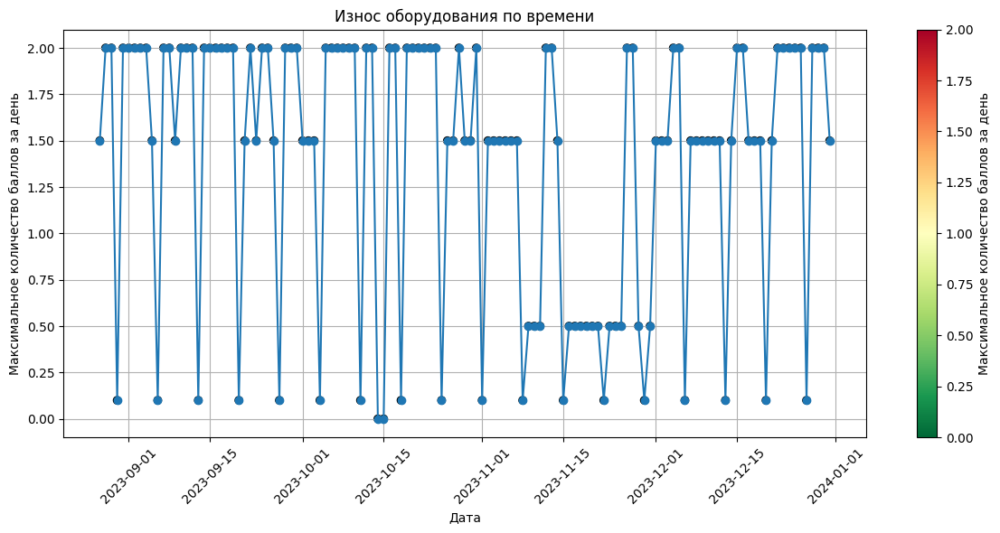

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Чтение данных
data_with_scores = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scoring.csv')

# Преобразование столбца с датой в формат datetime
data_with_scores['time'] = pd.to_datetime(data_with_scores['time'])

# Группировка данных по дате с максимизацией баллов за день
daily_scores = data_with_scores.set_index('time').resample('D')['score'].max().fillna(0)

# Создание графика
plt.figure(figsize=(12, 6))
plt.plot(daily_scores.index, daily_scores, marker='o', linestyle='-')

# Раскраска точек в зависимости от значения баллов с использованием цветовой карты
plt.scatter(daily_scores.index, daily_scores, c=daily_scores, cmap='RdYlGn_r', edgecolor='k')

# Настройка осей и заголовка
plt.colorbar(label='Максимальное количество баллов за день')  # Добавляем шкалу цветов
plt.xlabel('Дата')
plt.ylabel('Максимальное количество баллов за день')
plt.title('Износ оборудования по времени')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

# Отображение графика
plt.show()




**ДАЛЬШЕ НЕ СДЕЛАНО МОДЕЛИРОВАНИЕ**

In [ ]:
print(data_with_scores.columns)

Index(['time', 'P3-111/A_PT_341', 'P3-111/A_TT_341', 'P3-111/A_VT_341',
       'P3-111/A_VT_342', 'P3-111/A_VT_343', 'P3-111/B_PT_351',
       'P3-111/B_TT_351', 'P3-111/B_VT_351', 'P3-111/B_VT_352',
       'P3-111/B_VT_353', 'P3-111/C_PT_361', 'P3-111/C_TT_361',
       'P3-111/C_VT_361', 'P3-111/C_VT_363', 'P3-111/C_VT_362_scaled',
       'cluster', 'wash_day', 'class', 'score'],
      dtype='object')


**Модель LSTM**

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Загрузка данных
data = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_classified.csv')
data['time'] = pd.to_datetime(data['time'])
data.set_index('time', inplace=True)

# Кодирование классов в числовые метки
label_encoder = LabelEncoder()
data['class_encoded'] = label_encoder.fit_transform(data['class'])

def create_sequences(data, sequence_length=5):
    xs, ys = [], []
    for i in range(len(data) - sequence_length):
        xs.append(data.iloc[i:(i + sequence_length)]['class_encoded'].values)
        ys.append(data.iloc[i + sequence_length]['class_encoded'])
    return np.array(xs), np.array(ys)

sequence_length = 5
X, y = create_sequences(data)

from sklearn.model_selection import train_test_split

# Разбиение данных
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.utils import to_categorical

# Конвертация меток классов в категориальный формат
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Создание модели
model = Sequential([
    LSTM(50, input_shape=(sequence_length, 1), return_sequences=True),
    LSTM(50),
    Dense(len(label_encoder.classes_), activation='softmax')
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Обучение модели
history = model.fit(X_train, y_train_cat, epochs=2, validation_split=0.2)


Epoch 1/2


c:\Users\Admin\Desktop\myenv3.10\lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3531/3531 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - accuracy: 0.9161 - loss: 0.3204 - val_accuracy: 0.9739 - val_loss: 0.1068
Epoch 2/2
3531/3531 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9730 - loss: 0.1099 - val_accuracy: 0.9767 - val_loss: 0.0934


1104/1104 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - accuracy: 0.9748 - loss: 0.0972
Точность на тестовых данных: 0.974987268447876


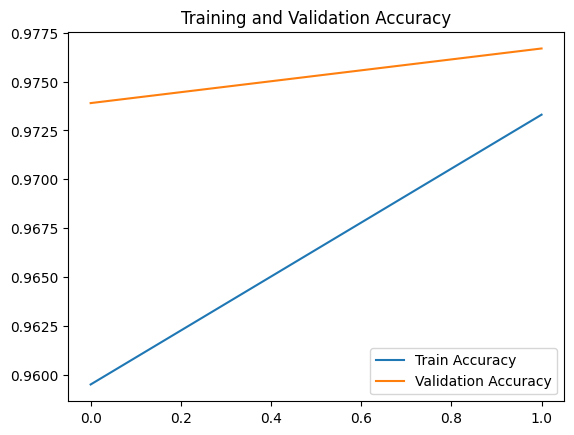

In [ ]:
import matplotlib.pyplot as plt

# Оценка модели на тестовых данных
_, accuracy = model.evaluate(X_test, y_test_cat)
print('Точность на тестовых данных:', accuracy)

# Визуализация процесса обучения
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


## СКЛерн Форкастеравторег ##

In [ ]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.pyplot as plt

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\P-111\P3-111_scoring.csv')

# Преобразование строки времени в формат datetime
df['time'] = pd.to_datetime(df['time'])

# Выбор целевой переменной (датчик давления)
y = df['P3-111/A_VT_341']

# Разделение данных на обучающую и тестовую выборки последовательно
n_test = int(len(y) * 0.2)
y_train, y_test = y[:-n_test], y[-n_test:]

# Создание модели прогнозирования
forecaster = ForecasterAutoreg(
    regressor=RandomForestRegressor(n_estimators=100, random_state=123),
    lags=10000  # Используем 10000 предыдущих значений для прогноза
)

# Обучение модели на данных датчика
forecaster.fit(y=y_train)

# Предсказание на тестовых данных
predictions = forecaster.predict(steps=n_test)

# Визуализация результатов
plt.figure(figsize=(10, 5))
plt.plot(df['time'][-len(y_test):], y_test, label='Test')
plt.plot(df['time'][-len(y_test):], predictions, label='Predictions')
plt.legend()
plt.show()


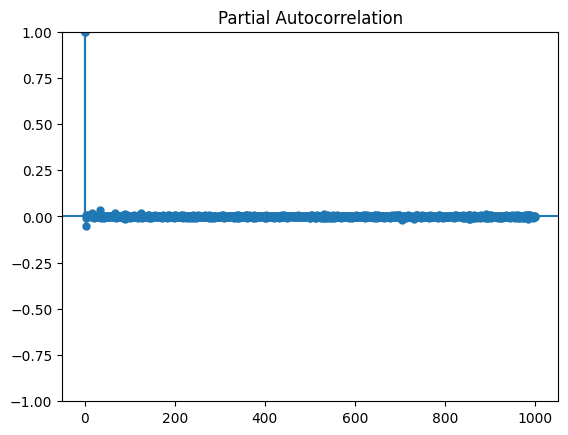

In [ ]:
# Испольуем частичную автокорреляцию для расчет оптимального количества лагов
from statsmodels.graphics.tsaplots import plot_pacf
import matplotlib.pyplot as plt

# Изобразим частичную автокорреляцию для датчика давления
plot_pacf(df['P3-111/B_PT_351'], lags=1000)
plt.show()


Модель не справляется с задачей прогнозирования временного ряда, и на графике частичной автокорреляции видно, что значимая корреляция обнаруживается только на первом лаге. Это может указывать на то, что временной ряд не имеет долгосрочной памяти и влияние предыдущих значений быстро затухает.

## Модель Секвеншиал ##

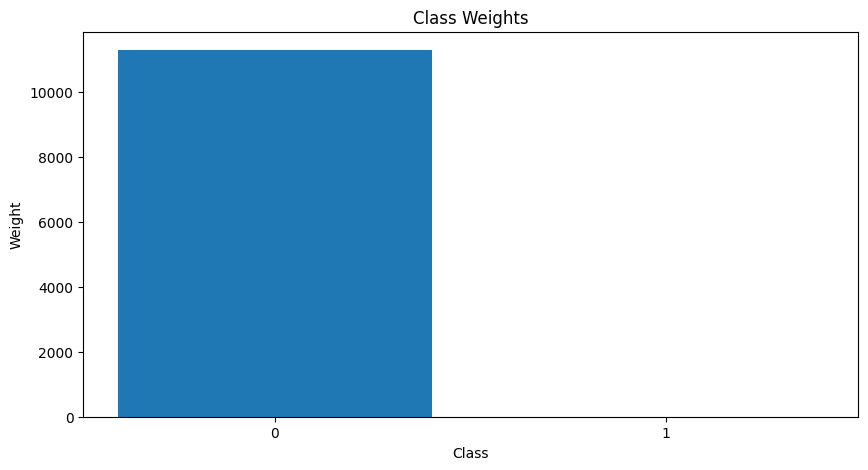

Epoch 1/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 2s 655us/step - accuracy: 0.9392 - loss: 6.4176 - val_accuracy: 1.0000 - val_loss: 0.0036
Epoch 2/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 634us/step - accuracy: 0.9999 - loss: 4.5479 - val_accuracy: 0.9991 - val_loss: 0.3786
Epoch 3/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 2s 657us/step - accuracy: 0.8054 - loss: 0.6831 - val_accuracy: 0.9988 - val_loss: 0.2958
Epoch 4/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 630us/step - accuracy: 0.8566 - loss: 0.6115 - val_accuracy: 0.9989 - val_loss: 0.2401
Epoch 5/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 2s 659us/step - accuracy: 0.9531 - loss: 0.3995 - val_accuracy: 0.9989 - val_loss: 0.2091
Epoch 6/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 632us/step - accuracy: 0.9804 - loss: 0.2354 - val_accuracy: 0.6746 - val_loss: 0.7958
Epoch 7/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 656us/step - accuracy: 0.8468 - loss: 0.2190 - val_accuracy: 0.6317 - val_loss: 0.8936
Epoch 8/50
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 633us/step - accuracy: 0.8337 -

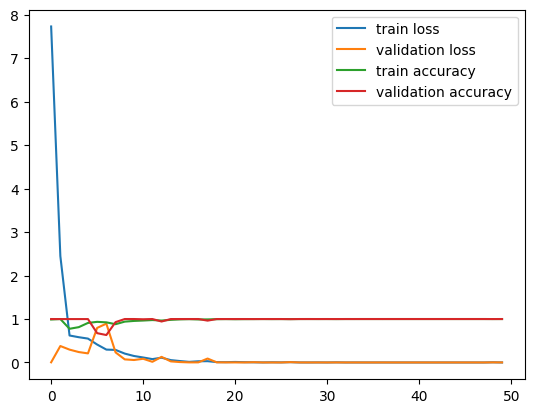

705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - accuracy: 1.0000 - loss: 6.1152e-05
Test Loss: 6.139995821285993e-05, Test Accuracy: 1.0
705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 515us/step
705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step


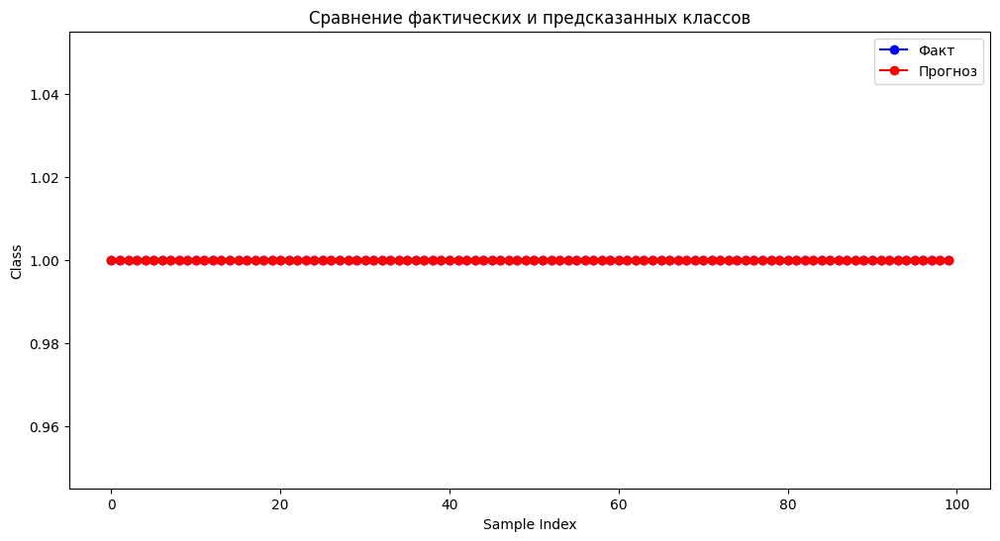

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации

y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)
y_categorical = to_categorical(y, num_classes=4)

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y_categorical, test_size=0.2, random_state=42)


# Пересчет весов классов с учетом реального распределения
class_weights = compute_class_weight('balanced', classes=np.unique(y_train.argmax(axis=1)), y=y_train.argmax(axis=1))
class_weight_dict = dict(enumerate(class_weights))

# Визуализация весов классов
plt.figure(figsize=(10, 5))
plt.bar(range(len(class_weight_dict)), list(class_weight_dict.values()), align='center')
plt.xticks(range(len(class_weight_dict)), list(class_weight_dict.keys()))
plt.title('Class Weights')
plt.ylabel('Weight')
plt.xlabel('Class')
plt.show()

# Создание модели
model = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(10, activation='relu'),
    Dense(10, activation='relu'),
    Dense(4, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Обучение модели
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, class_weight=class_weight_dict)

# Визуализация истории обучения
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.legend()
plt.show()

# Сохранение модели
model.save("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_model.keras")

# Оценка модели
eval_result = model.evaluate(X_test, y_test)
print(f"Test Loss: {eval_result[0]}, Test Accuracy: {eval_result[1]}")

# Предсказания модели и их обработка
predictions = model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

# Визуализация первых 100 предсказаний
plt.figure(figsize=(12, 6))
plt.plot(true_classes[:100], 'bo-', label='Факт')
plt.plot(predicted_classes[:100], 'ro-', label='Прогноз')
plt.fill_between(np.arange(100), predicted_classes[:100], true_classes[:100], color='r', alpha=0.3)
plt.title('Сравнение фактических и предсказанных классов')
plt.xlabel('Sample Index')
plt.ylabel('Class')
plt.legend()
plt.show()



In [ ]:

print(X_train.shape)  # Prints the shape of the training feature set
print(X_test.shape)   # Prints the shape of the testing feature set
print(y_train.shape)  # Prints the shape of the training labels
print(y_test.shape)

(90228, 70)
(22557, 70)
(90228, 4)
(22557, 4)


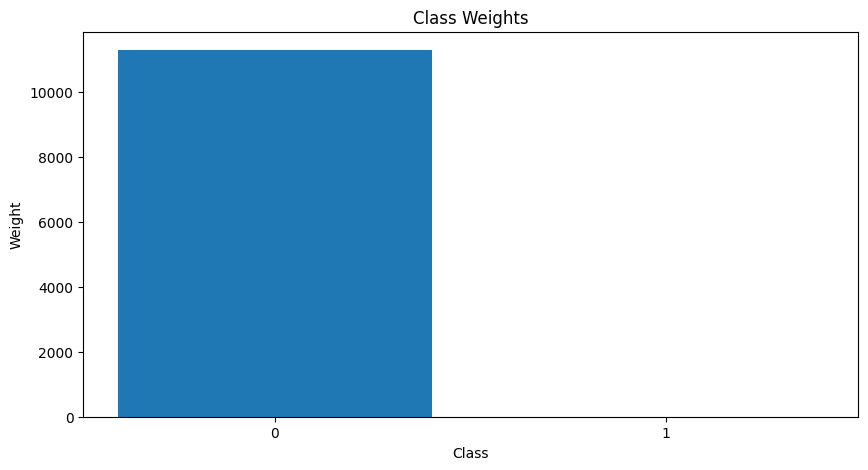

Epoch 1/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 2s 666us/step - accuracy: 0.9863 - loss: 4.9456 - val_accuracy: 1.0000 - val_loss: 5.1673e-04
Epoch 2/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 646us/step - accuracy: 0.9999 - loss: 4.6554 - val_accuracy: 1.0000 - val_loss: 0.0092
Epoch 3/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 2s 658us/step - accuracy: 1.0000 - loss: 1.1419 - val_accuracy: 1.0000 - val_loss: 0.0046
Epoch 4/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 622us/step - accuracy: 1.0000 - loss: 2.6675 - val_accuracy: 1.0000 - val_loss: 0.0407
Epoch 5/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 623us/step - accuracy: 0.9732 - loss: 2.3627 - val_accuracy: 1.0000 - val_loss: 0.0409
Epoch 6/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 653us/step - accuracy: 0.9260 - loss: 0.5542 - val_accuracy: 1.0000 - val_loss: 0.0510
Epoch 7/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 629us/step - accuracy: 0.9962 - loss: 0.0921 - val_accuracy: 0.8033 - val_loss: 0.3755
Epoch 8/200
2256/2256 ━━━━━━━━━━━━━━━━━━━━ 1s 635us/step - accura

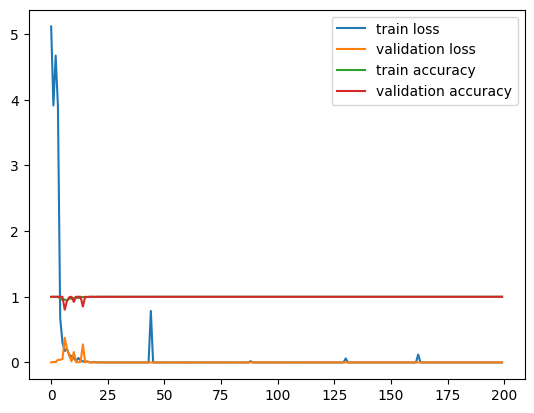

705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step - accuracy: 1.0000 - loss: 1.1114e-08
Test Loss: 2.8565722232087865e-08, Test Accuracy: 1.0
705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 510us/step


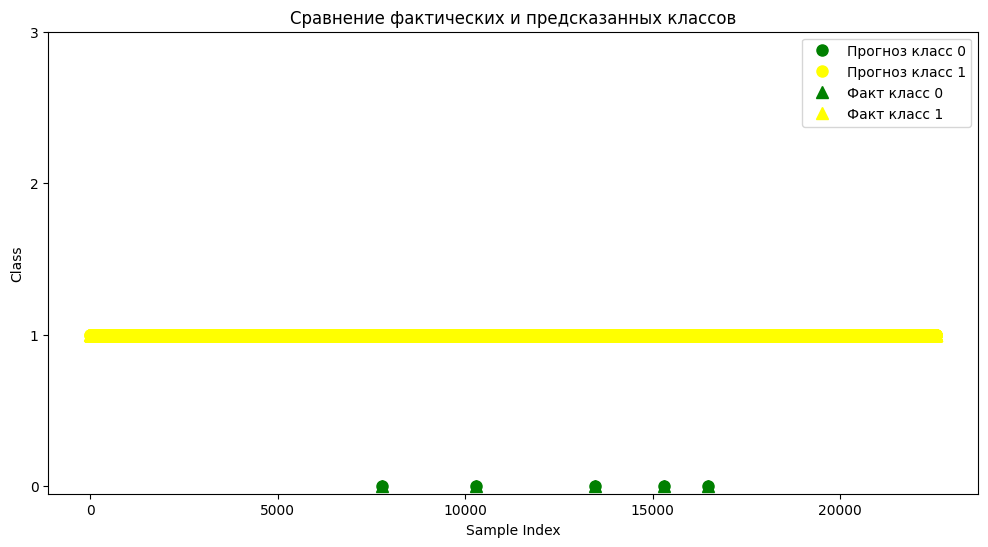

In [ ]:
# Модель Секвкеншиал, предикт на 4 класса, тренировка с учетом дисбаланса весов в сторону класса 0.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации

y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние
y_categorical = to_categorical(y, num_classes=4)

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y_categorical, test_size=0.2, random_state=42)


# Пересчет весов классов с учетом реального распределения
class_weights = compute_class_weight('balanced', classes=np.unique(y_train.argmax(axis=1)), y=y_train.argmax(axis=1))
class_weight_dict = dict(enumerate(class_weights))

# Визуализация весов классов
plt.figure(figsize=(10, 5))
plt.bar(range(len(class_weight_dict)), list(class_weight_dict.values()), align='center')
plt.xticks(range(len(class_weight_dict)), list(class_weight_dict.keys()))
plt.title('Class Weights')
plt.ylabel('Weight')
plt.xlabel('Class')
plt.show()

# Создание модели
model = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(10, activation='relu'),
    Dense(10, activation='relu'),
    Dense(4, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Обучение модели
history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.2, class_weight=class_weight_dict)

# Визуализация истории обучения
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.legend()
plt.show()

# Сохранение модели
model.save("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_model.keras")

# Оценка модели
eval_result = model.evaluate(X_test, y_test)
print(f"Test Loss: {eval_result[0]}, Test Accuracy: {eval_result[1]}")

predictions = model.predict(X_test)

num_points_to_visualize = 5000

predicted_classes = np.argmax(predictions, axis=1)[:num_points_to_visualize]
true_classes = np.argmax(y_test, axis=1)[:num_points_to_visualize]
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

colors = ['green', 'yellow', 'orange', 'red']  # цвета для классов

plt.figure(figsize=(12, 6))

# Сохраняем ссылки на объекты для легенды
lines = []

# Визуализируем точки для предсказанных классов
for i in np.unique(predicted_classes):
    idx = predicted_classes == i
    line, = plt.plot(np.where(idx)[0], predicted_classes[idx], 'o', label='Прогноз класс ' + str(i), color=colors[i], markersize=8)
    lines.append(line)

# Визуализируем точки для фактических классов
for i in np.unique(true_classes):
    idx = true_classes == i
    line, = plt.plot(np.where(idx)[0], true_classes[idx], '^', label='Факт класс ' + str(i), color=colors[i], markersize=8)
    lines.append(line)

plt.title('Сравнение фактических и предсказанных классов')
plt.xlabel('Sample Index')
plt.ylabel('Class')
plt.yticks([0, 1, 2, 3])
plt.legend()
plt.show()

705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - accuracy: 1.0000 - loss: 1.1114e-08
Test Loss: 2.8565722232087865e-08, Test Accuracy: 1.0
705/705 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step


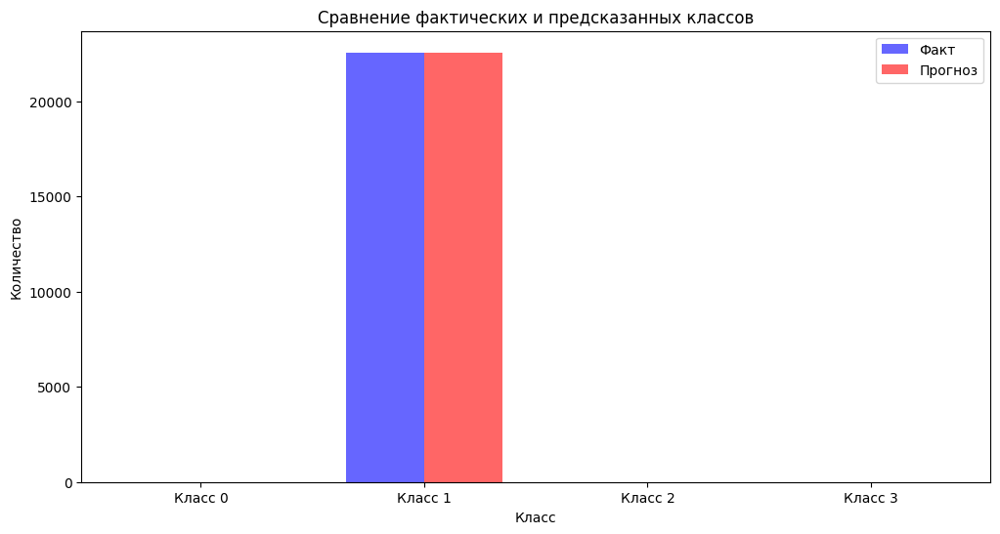

In [ ]:
# Визуализация ошибки между фактическими классами и предсказанными как абсолютное значение
import numpy as np
import matplotlib.pyplot as plt

# Количество классов
num_classes = 4
# Оценка модели
eval_result = model.evaluate(X_test, y_test)
print(f"Test Loss: {eval_result[0]}, Test Accuracy: {eval_result[1]}")

predictions = model.predict(X_test)

num_points_to_visualize = 5000

predicted_classes = np.argmax(predictions, axis=1)[:num_points_to_visualize]
true_classes = np.argmax(y_test, axis=1)[:num_points_to_visualize]
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

# Инициализация счетчика предсказаний и фактов
class_counts_pred = np.zeros(num_classes)
class_counts_true = np.zeros(num_classes)

# Подсчет предсказаний и фактов для каждого класса
for i in range(num_classes):
    class_counts_pred[i] = np.sum(predicted_classes == i)
    class_counts_true[i] = np.sum(true_classes == i)

# Ширина столбцов
bar_width = 0.35

# Индексы для групп классов
index = np.arange(num_classes)

# Создание графика
fig, ax = plt.subplots(figsize=(12, 6))

# Столбцы для фактических классов
rects1 = ax.bar(index, class_counts_true, bar_width, label='Факт', color='b', alpha=0.6)

# Столбцы для предсказанных классов
rects2 = ax.bar(index + bar_width, class_counts_pred, bar_width, label='Прогноз', color='r', alpha=0.6)

# Добавление меток, заголовка и пользовательской легенды
ax.set_xlabel('Класс')
ax.set_ylabel('Количество')
ax.set_title('Сравнение фактических и предсказанных классов')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(['Класс 0', 'Класс 1', 'Класс 2', 'Класс 3'])
ax.legend()

plt.show()


In [ ]:
import numpy as np
# y_test  numpy массив с one-hot encoded метками классов

# Получаем одномерный массив меток классов из one-hot encoded векторов
true_classes = np.argmax(y_test, axis=1)

# Посчитаем распределение истинных классов по всему датасету
unique, counts = np.unique(true_classes, return_counts=True)
distribution = dict(zip(unique, counts))

print("Распределение классов в y_test:", distribution)


Распределение классов в y_test: {0: 5, 1: 22552}


**Распределение классов в y_test: {0: 5, 1: 22552}. Это мега  перекос. Нужно понизить пороги для определения классов.**

In [ ]:
# Модель Секвкеншиал, ребалансировка классов методом SMOTE, на жтот раз предсказываем температуру
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from imblearn.over_sampling import SMOTE

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации

y = df[['P3-111/A_TT_341_State', 'P3-111/B_TT_351_State', 'P3-111/C_TT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние
y_categorical = to_categorical(y, num_classes=4)

# Разделение данных на обучающий и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y_categorical, test_size=0.2, random_state=42)

# Преобразование y_train из one-hot в метки классов для SMOTE
y_train_labels = np.argmax(y_train, axis=1)

# Балансировка классов с использованием SMOTE
smote = SMOTE(k_neighbors=4)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train_labels)

# Преобразуем y_train_resampled обратно в one-hot encoding
y_train_resampled = to_categorical(y_train_resampled, num_classes=4)

# Создание модели
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(4, activation='softmax')
])

# Компиляция модели
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Обучение модели
history = model.fit(X_train_resampled, y_train_resampled, epochs=10, batch_size=32, validation_split=0.1)

# Оценка модели
eval_result = model.evaluate(X_test, y_test)
print(f"Test Loss: {eval_result[0]}, Test Accuracy: {eval_result[1]}")

# Визуализация истории обучения
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.title('Training History')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# Сохранение модели
model.save("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_model_tt.keras")

# Оценка модели
eval_result = model.evaluate(X_test, y_test)
print(f"Test Loss: {eval_result[0]}, Test Accuracy: {eval_result[1]}")

predictions = model.predict(X_test)

num_points_to_visualize = 5000

predicted_classes = np.argmax(predictions, axis=1)[:num_points_to_visualize]
true_classes = np.argmax(y_test, axis=1)[:num_points_to_visualize]
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

colors = ['green', 'yellow', 'orange', 'red']  # цвета для классов

plt.figure(figsize=(12, 6))

# Сохраняем ссылки на объекты для легенды
lines = []

# Визуализируем точки для предсказанных классов
for i in np.unique(predicted_classes):
    idx = predicted_classes == i
    line, = plt.plot(np.where(idx)[0], predicted_classes[idx], 'o', label='Прогноз класс ' + str(i), color=colors[i], markersize=8)
    lines.append(line)

# Визуализируем точки для фактических классов
for i in np.unique(true_classes):
    idx = true_classes == i
    line, = plt.plot(np.where(idx)[0], true_classes[idx], '^', label='Факт класс ' + str(i), color=colors[i], markersize=8)
    lines.append(line)

plt.title('Сравнение фактических и предсказанных классов')
plt.xlabel('Sample Index')
plt.ylabel('Class')
plt.yticks([0, 1, 2, 3])
plt.legend()
plt.show()

ValueError: The target 'y' needs to have more than 1 class. Got 1 class instead

## Логическая регрессия ##

Model Accuracy Score : 99.98 %
--------------------------------------------------------
Classification_Report: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         5
           1       1.00      1.00      1.00     22552

    accuracy                           1.00     22557
   macro avg       1.00      0.50      0.50     22557
weighted avg       1.00      1.00      1.00     22557

--------------------------------------------------------


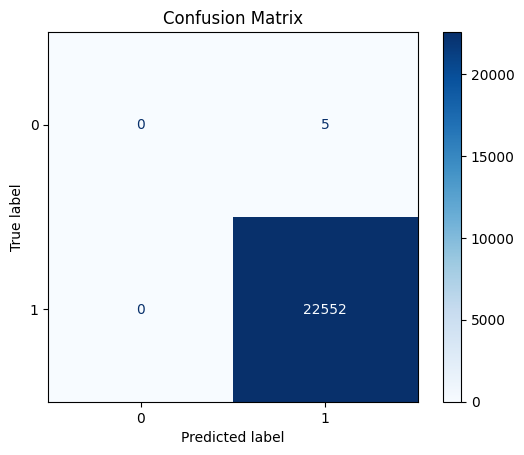

In [ ]:
# Импорт необходимых библиотек и классов
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.metrics import ConfusionMatrixDisplay

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации
y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y, test_size=0.2, random_state=42)

# Инициализация и обучение модели логистической регрессии
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Получение предсказаний на тестовом наборе
y_pred_lr = logreg.predict(X_test)

# Вычисление точности модели
log_accuracy = round(accuracy_score(y_pred_lr, y_test) * 100, 2)

print("Model Accuracy Score :", log_accuracy, "%")
print("\033[1m--------------------------------------------------------\033[0m")
# Вывод отчета о классификации с учетом параметра zero_division
print("Classification_Report: \n", classification_report(y_test, y_pred_lr, zero_division=1))
print("\033[1m--------------------------------------------------------\033[0m")

# Построение матрицы ошибок
cm = confusion_matrix(y_test, y_pred_lr)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()



модель предсказывает только один из четырех классов, что отражается в отчете о классификации.

Класс 0: У модели есть предсказания только для 5 образцов этого класса, и все они неправильные.
Класс 1: У модели есть предсказания для всех 22552 образцов этого класса, и все они правильные.
Таким образом, метрики precision, recall и f1-score для класса 0 равны нулю, так как нет правильных предсказаний для этого класса. А метрики для класса 1 равны 1.0, так как все предсказания для этого класса верные.

Средневзвешенное значение (weighted avg) учитывает дисбаланс классов, поэтому оно равно 1.0, так как класс 1 имеет значительно большее количество образцов.

## Дерево решений ##

Model Accuracy Score : 100.0 %
--------------------------------------------------------
Classification_Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00     22552

    accuracy                           1.00     22557
   macro avg       1.00      1.00      1.00     22557
weighted avg       1.00      1.00      1.00     22557

--------------------------------------------------------


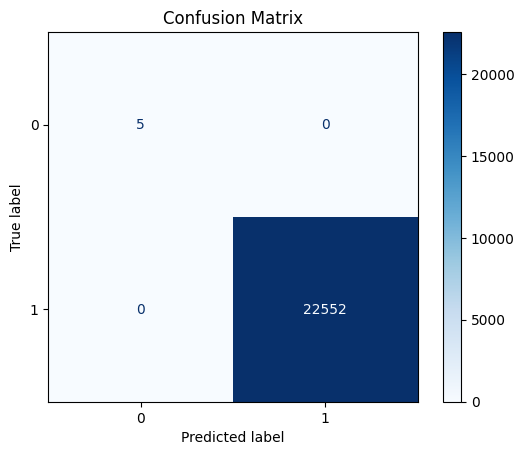

In [ ]:
# Импорт необходимых библиотек и классов
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации
y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y, test_size=0.2, random_state=42)

# Инициализация и обучение модели дерева решений
decision = DecisionTreeClassifier()
decision.fit(X_train, y_train)

# Получение предсказаний на тестовом наборе
y_pred_dec = decision.predict(X_test)

# Вычисление точности модели
decision_accuracy = round(accuracy_score(y_pred_dec, y_test) * 100, 2)

print("Model Accuracy Score :", decision_accuracy, "%")
print("\033[1m--------------------------------------------------------\033[0m")
print("Classification_Report: \n", classification_report(y_test, y_pred_dec))
print("\033[1m--------------------------------------------------------\033[0m")

# Построение матрицы ошибок
cm = confusion_matrix(y_test, y_pred_dec)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


## Случайный лес ##

Model Accuracy Score : 99.99 %
--------------------------------------------------------
Classification_Report: 
               precision    recall  f1-score   support

           0       1.00      0.60      0.75         5
           1       1.00      1.00      1.00     22552

    accuracy                           1.00     22557
   macro avg       1.00      0.80      0.87     22557
weighted avg       1.00      1.00      1.00     22557

--------------------------------------------------------


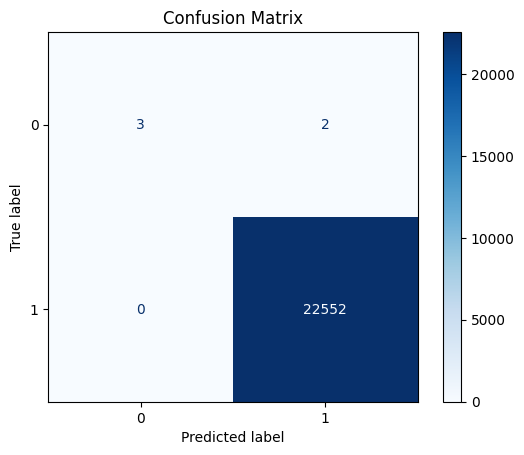

In [ ]:
# Импорт необходимых библиотек и классов
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации
y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y, test_size=0.2, random_state=42)

# Инициализация и обучение модели случайного леса
random_forest = RandomForestClassifier(n_estimators=100)
random_forest.fit(X_train, y_train)

# Получение предсказаний на тестовом наборе
y_pred_rf = random_forest.predict(X_test)

# Вычисление точности модели
random_forest_accuracy = round(accuracy_score(y_pred_rf, y_test) * 100, 2)

print("Model Accuracy Score :", random_forest_accuracy, "%")
print("\033[1m--------------------------------------------------------\033[0m")
print("Classification_Report: \n", classification_report(y_test, y_pred_rf))
print("\033[1m--------------------------------------------------------\033[0m")

# Построение матрицы ошибок
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


Машина поддержки векторов

Model Accuracy Score : 100.0 %
--------------------------------------------------------
Classification_Report: 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      1.00      1.00     22552

    accuracy                           1.00     22557
   macro avg       1.00      0.90      0.94     22557
weighted avg       1.00      1.00      1.00     22557

--------------------------------------------------------


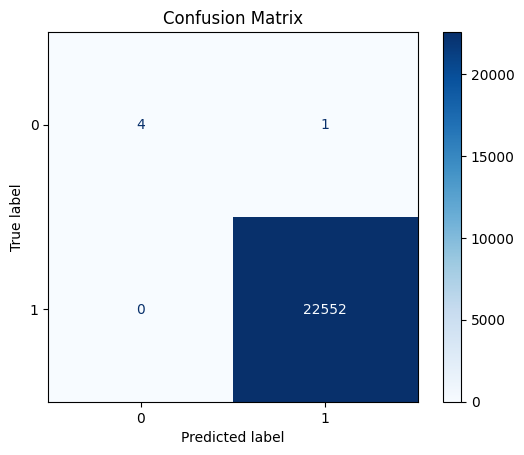

In [ ]:
# Импорт необходимых библиотек и классов
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])

# Подготовка целевых переменных для многоклассовой классификации
y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y, test_size=0.2, random_state=42)

# Инициализация и обучение модели Support Vector Machines
svc = SVC()
svc.fit(X_train, y_train)

# Получение предсказаний на тестовом наборе
y_pred_svc = svc.predict(X_test)

# Вычисление точности модели
svc_accuracy = round(accuracy_score(y_pred_svc, y_test) * 100, 2)

print("Model Accuracy Score :", svc_accuracy, "%")
print("\033[1m--------------------------------------------------------\033[0m")
print("Classification_Report: \n", classification_report(y_test, y_pred_svc))
print("\033[1m--------------------------------------------------------\033[0m")

# Построение матрицы ошибок
cm = confusion_matrix(y_test, y_pred_svc)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_test))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


ГАМА не работает, проблем с ее внутренним импортом скорерс из склерн метрикс, который изменился.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import __all__
from gama import GamaClassifier
from sklearn.metrics._scorer import _SCORERS

if __name__ == "__main__":
    # Загрузка данных из файла CSV
    file_path = "C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv"
    data = pd.read_csv(file_path)

    # Разделение данных на признаки (X) и метки классов (y)
    X = data.drop(columns=["target_column"])
    y = data["target_column"]

    # Разделение данных на обучающий и тестовый наборы
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Инициализация и обучение GamaClassifier
    automl = GamaClassifier(max_total_time=180, store="nothing", n_jobs=1)
    print("Starting `fit` which will take roughly 3 minutes.")
    automl.fit(X_train, y_train)

    # Предсказание меток классов
    label_predictions = automl.predict(X_test)

    # Предсказание вероятностей классов
    probability_predictions = automl.predict_proba(X_test)


ImportError: cannot import name 'SCORERS' from 'sklearn.metrics._scorer' (c:\Users\Admin\Desktop\myenv3.10\lib\site-packages\sklearn\metrics\_scorer.py)

In [ ]:
# Импорт необходимых библиотек и классов
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, log_loss
from gama import GamaClassifier

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Преобразование строковых меток в целочисленные значения для каждой колонки состояния
state_mapping = {'Normal': 0, 'Attention': 1, 'Warning': 2, 'Critical': 3}
for col in df.columns:
    if "State" in col:
        df[col] = df[col].map(state_mapping)

# Заполнение NaN только для числовых столбцов
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
df[numeric_cols] = df[numeric_cols].apply(lambda x: x.fillna(x.mean()))

# Нормализация данных
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[numeric_cols])
# Подготовка целевых переменных для многоклассовой классификации
y = df[['P3-111/A_PT_341_State', 'P3-111/B_PT_351_State', 'P3-111/C_PT_361_State']]
y = y.mean(axis=1).astype(int)  # усредненное состояние

# Разделение данных на обучающий и тестовый наборы
# Замените X_train, X_test, y_train, y_test на ваши данные
X_train, X_test, y_train, y_test = train_test_split(df_scaled, y, stratify=y, random_state=0)

# Инициализация и обучение GamaClassifier
automl = GamaClassifier(max_total_time=180, store="nothing", n_jobs=1)
print("Starting `fit` which will take roughly 3 minutes.")
automl.fit(X_train, y_train)

# Предсказание меток классов
label_predictions = automl.predict(X_test)

# Предсказание вероятностей классов
probability_predictions = automl.predict_proba(X_test)

# Оценка качества модели
print("accuracy:", accuracy_score(y_test, label_predictions))
print("log loss:", log_loss(y_test, probability_predictions))


ImportError: cannot import name 'SCORERS' from 'sklearn.metrics._scorer' (c:\Users\Admin\Desktop\myenv3.10\lib\site-packages\sklearn\metrics\_scorer.py)

## Алгоритм SOM (карты Таро) ##

In [ ]:
import pandas as pd

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Получение списка всех колонок с показаниями датчиков
sensor_columns = [col for col in df.columns if "_State" in col]

# Проверка наличия показания отличного от 0 (нормальное состояние) для каждого датчика
missing_normal_state_sensors = [col for col in sensor_columns if not (df[col] != 0).any()]

if len(missing_normal_state_sensors) == 0:
    print("Для всех датчиков есть показания отличные от 0 (нормальное состояние).")
else:
    print("Следующие датчики не имеют показаний отличных от 0 (нормальное состояние):")
    print(missing_normal_state_sensors)

Для всех датчиков есть показания отличные от 0 (нормальное состояние).


In [ ]:
import pandas as pd

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Получение списка столбцов для удаления
columns_to_drop = [col for col in df.columns if any(keyword in col for keyword in ["Min_Value", "Max_Value", "Unit", "std", "State"])]

# Удаление столбцов
df_filtered = df.drop(columns=columns_to_drop)

# Вывод информации о новом наборе данных
print("Размеры датафрейма после удаления ненужных столбцов:", df_filtered.shape)
print("Пример первых нескольких строк в новом датафрейме:")
print(df_filtered.head())


Размеры датафрейма после удаления ненужных столбцов: (112785, 18)
Пример первых нескольких строк в новом датафрейме:
   Unnamed: 0                 time  P3-111/A_PT_341  P3-111/A_TT_341  \
0           1  2023-08-27 18:07:00        13.451339        37.337505   
1           2  2023-08-27 18:08:00        13.665502        37.369112   
2           3  2023-08-27 18:09:00        13.642291        37.394400   
3           4  2023-08-27 18:10:00        13.590701        37.397612   
4           5  2023-08-27 18:11:00        13.553198        37.374533   

   P3-111/A_VT_341  P3-111/A_VT_342  P3-111/A_VT_343  P3-111/B_PT_351  \
0         1.606807         1.584566         1.095814         0.086433   
1         1.684209         1.490892         1.014345         0.086214   
2         1.594963         1.568996         1.004908         0.086777   
3         1.563321         1.563761         1.054339         0.087255   
4         1.633177         1.541707         1.119632         0.087809   

   P3-111/B

In [ ]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112785 entries, 0 to 112784
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Unnamed: 0       112785 non-null  int64  
 1   time             112785 non-null  int64  
 2   P3-111/A_PT_341  112785 non-null  float64
 3   P3-111/A_TT_341  112785 non-null  float64
 4   P3-111/A_VT_341  112785 non-null  float64
 5   P3-111/A_VT_342  112785 non-null  float64
 6   P3-111/A_VT_343  112785 non-null  float64
 7   P3-111/B_PT_351  112785 non-null  float64
 8   P3-111/B_TT_351  112785 non-null  float64
 9   P3-111/B_VT_351  112785 non-null  float64
 10  P3-111/B_VT_352  112785 non-null  float64
 11  P3-111/B_VT_353  112785 non-null  float64
 12  P3-111/C_PT_361  112785 non-null  float64
 13  P3-111/C_TT_361  112785 non-null  float64
 14  P3-111/C_VT_361  112785 non-null  float64
 15  P3-111/C_VT_362  112785 non-null  float64
 16  P3-111/C_VT_363  112785 non-null  floa

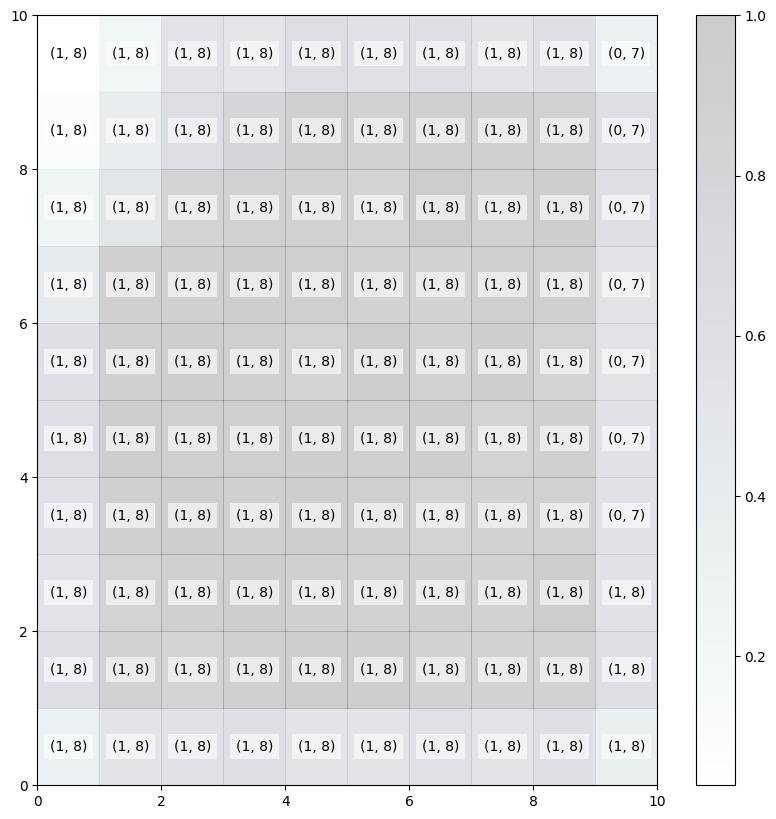

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom
import matplotlib.pyplot as plt
import numpy as np

# Преобразование времени в секунды с начала эпохи (если столбец времени используется в анализе)
df_filtered['time'] = pd.to_datetime(df_filtered['time']).astype('int64') // 10**9

# Удаление столбца временных интервалов если он не нужен для анализа
if 'timedelta' in df_filtered.columns:
    df_filtered = df_filtered.drop(columns=['time_diff'])

# Выборка колонок для масштабирования - исключаем все нечисловые или ненужные столбцы
columns_to_scale = [col for col in df_filtered.columns if col not in ['Unnamed: 0', 'time','time_diff']]
X = df_filtered[columns_to_scale]

# Масштабирование данных
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Определение размеров карты SOM
map_size = (10, 10)

# Инициализация и обучение SOM
som = MiniSom(map_size[0], map_size[1], X_scaled.shape[1], sigma=0.5, learning_rate=0.5)
som.train_random(X_scaled, 1000)

# Визуализация
plt.figure(figsize=(10, 10))
plt.pcolor(som.distance_map().T, cmap='bone_r', alpha=0.2)
plt.colorbar()

# Отображение всех нейронов
for i in range(map_size[0]):
    for j in range(map_size[1]):
        plt.text(i + 0.5, j + 0.5, str(som.winner(X_scaled[np.argmin(np.linalg.norm(som.get_weights() - som.get_weights()[i, j], axis=-1))])), ha='center', va='center', bbox=dict(facecolor='white', alpha=0.6, lw=0))
plt.show()



In [ ]:
import numpy as np
# Что все это значит, что это за карты? Попробуем проанализировать
# Карта расстояний
distance_map = som.distance_map()
print("Карта расстояний (Distance Map):")
print(distance_map)

# Веса нейронов
print("\nВеса нейронов:")
for i in range(map_size[0]):
    for j in range(map_size[1]):
        print(f"Нейрон ({i},{j}) веса: {som.get_weights()[i, j]}")

# Ассоциации данных с нейронами
win_map = som.win_map(X_scaled)
print("\nПрисвоение данных к нейронам (Win Map):")
for position in win_map.keys():
    print(f"Нейрон {position} ассоциируется с {len(win_map[position])} образцами.")

# Частота побед нейрона
hits = np.zeros((map_size[0], map_size[1]))
for cnt, xx in enumerate(X_scaled):
    w = som.winner(xx)  # Получение победителя для каждого образца
    hits[w[0], w[1]] += 1

print("\nЧастота побед нейронов (Hits):")
print(hits)


Карта расстояний (Distance Map):
[[0.3139276  0.59143524 0.53162781 0.57426205 0.62390098 0.57680242
  0.432736   0.2507516  0.09516176 0.03884736]
 [0.51640053 0.86946469 0.84715786 0.89262117 0.95825889 0.90687807
  0.89212133 0.495731   0.37555492 0.22176759]
 [0.55001324 0.81841669 0.90759025 0.94379943 0.931621   0.93999788
  0.90726871 0.84305518 0.61620975 0.53128101]
 [0.58615645 0.90535541 0.94158708 0.91014044 0.91717536 0.9323204
  0.95714405 0.88329358 0.78113135 0.50449072]
 [0.52151393 0.9542805  0.9013416  0.94632199 0.94980392 0.84934763
  0.92872006 0.85666201 0.90715945 0.63406459]
 [0.51912631 0.95170173 0.88023396 0.91524363 0.91424932 0.96845433
  0.85472873 0.84206    0.86730168 0.5744236 ]
 [0.56414332 0.86934983 0.89359665 0.84812895 0.95337169 0.85472117
  0.86908515 1.         0.92913821 0.61126773]
 [0.53748042 0.86830362 0.85000032 0.86650042 0.83922848 0.93730911
  0.91490213 0.88247177 0.90944708 0.54531216]
 [0.58196187 0.85358019 0.96506833 0.89010958 0.

- Карты расстояний (Distance Maps): Показывают евклидово расстояние между каждым нейроном и его соседями, полезно для определения границ кластеров.
- Веса Нейронов: Можно анализировать веса нейронов напрямую, чтобы понять, какие признаки активируют определённые нейроны.
- Присвоение данных к нейронам (Hits): Определение, какие входные данные ассоциируются с какими нейронами, может помочь понять структуру данных.
- Частота побед нейрона (Neuron Hits): Сколько раз каждый нейрон становился "победителем" для входных данных.
- А в целом ничего не понятно! Как с помощью этих нейронов можно перейти к практическому предикту, не понимаю.

In [ ]:
# Печать весов нейрона (1,9)
print("Веса нейрона (1,9):", som.get_weights()[1, 9])

# Печать данных, ассоциированных с нейроном (1,9)
associated_data = som.win_map(X_scaled)[(1, 9)]
print("Данные, ассоциированные с нейроном (1,9):", associated_data)
# Ищем, когда активизироуется нейрон, у которого только 159 ассоциаций.

Веса нейрона (1,9): [ 0.67558243  0.49790972  0.2029639   0.18713164  0.16446762  0.05596958
  0.37623148 -0.02572186  0.06709678 -0.01285537  0.04824072  0.57202787
  0.15203311  0.07741475  0.11157916]
Данные, ассоциированные с нейроном (1,9): [array([7.52249577e-01, 4.87356775e-01, 1.41426045e-01, 1.75313918e-01,
       1.26210739e-01, 7.82420337e-02, 4.03792047e-01, 1.57620560e-02,
       2.16569615e-02, 1.73997489e-05, 0.00000000e+00, 5.70872178e-01,
       1.18475678e-01, 1.09781198e-01, 1.08403061e-01]), array([7.51618885e-01, 5.05330926e-01, 1.57289492e-01, 1.77892929e-01,
       1.41365916e-01, 7.99685833e-02, 3.86651127e-01, 1.22973012e-02,
       2.37735039e-02, 1.92674631e-05, 0.00000000e+00, 5.76697650e-01,
       1.24810076e-01, 1.18298280e-01, 1.19265814e-01]), array([7.59135320e-01, 4.61534622e-01, 1.77703903e-01, 2.13415551e-01,
       1.55699175e-01, 7.88675826e-02, 3.51348308e-01, 2.07366542e-02,
       2.94108682e-02, 2.15564135e-05, 0.00000000e+00, 5.41001830e-01,


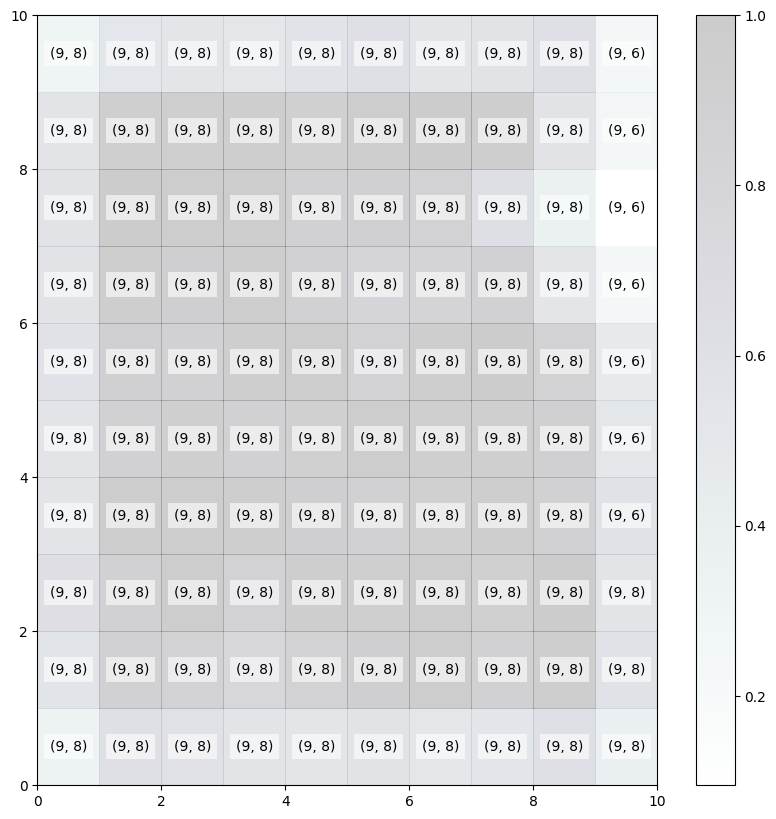

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom
import matplotlib.pyplot as plt
import numpy as np

# Сохранение временных меток
time_stamps = df_filtered['time'].copy()
# Преобразование времени в секунды с начала эпохи (если столбец времени используется в анализе)
df_filtered['time'] = pd.to_datetime(df_filtered['time']).astype('int64') // 10**9

# Удаление столбца временных интервалов если он не нужен для анализа
if 'timedelta' in df_filtered.columns:
    df_filtered = df_filtered.drop(columns=['time_diff'])

# Выборка колонок для масштабирования - исключаем все нечисловые или ненужные столбцы
columns_to_scale = [col for col in df_filtered.columns if col not in ['Unnamed: 0', 'time','time_diff']]
X = df_filtered[columns_to_scale]

# Масштабирование данных
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Определение размеров карты SOM
map_size = (10, 10)

# Инициализация и обучение SOM
som = MiniSom(map_size[0], map_size[1], X_scaled.shape[1], sigma=0.5, learning_rate=0.5)
som.train_random(X_scaled, 1000)

# Сохранение временных меток
time_stamps = df_filtered['time'].copy()
# Визуализация
plt.figure(figsize=(10, 10))
plt.pcolor(som.distance_map().T, cmap='bone_r', alpha=0.2)
plt.colorbar()

# Отображение всех нейронов
for i in range(map_size[0]):
    for j in range(map_size[1]):
        plt.text(i + 0.5, j + 0.5, str(som.winner(X_scaled[np.argmin(np.linalg.norm(som.get_weights() - som.get_weights()[i, j], axis=-1))])), ha='center', va='center', bbox=dict(facecolor='white', alpha=0.6, lw=0))
plt.show()


In [ ]:
file_path = "C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv"
df = pd.read_csv(file_path)
print(df.columns)

Index(['Unnamed: 0', 'time', 'P3-111/A_PT_341', 'P3-111/A_TT_341',
       'P3-111/A_VT_341', 'P3-111/A_VT_342', 'P3-111/A_VT_343',
       'P3-111/A_PT_341_std', 'P3-111/A_TT_341_std', 'P3-111/A_VT_341_std',
       'P3-111/A_VT_342_std', 'P3-111/A_VT_343_std', 'P3-111/B_PT_351',
       'P3-111/B_TT_351', 'P3-111/B_VT_351', 'P3-111/B_VT_352',
       'P3-111/B_VT_353', 'P3-111/B_PT_351_std', 'P3-111/B_TT_351_std',
       'P3-111/B_VT_351_std', 'P3-111/B_VT_352_std', 'P3-111/B_VT_353_std',
       'P3-111/C_PT_361', 'P3-111/C_TT_361', 'P3-111/C_VT_361',
       'P3-111/C_VT_362', 'P3-111/C_VT_363', 'P3-111/C_PT_361_std',
       'P3-111/C_TT_361_std', 'P3-111/C_VT_361_std', 'P3-111/C_VT_362_std',
       'P3-111/C_VT_363_std', 'P3-111/A_PT_341_Min_Value',
       'P3-111/A_PT_341_Max_Value', 'P3-111/A_PT_341_Unit',
       'P3-111/A_TT_341_Min_Value', 'P3-111/A_TT_341_Max_Value',
       'P3-111/A_TT_341_Unit', 'P3-111/A_VT_341_Min_Value',
       'P3-111/A_VT_341_Max_Value', 'P3-111/A_VT_341_Unit

## ТПОТ ## (уже после митинга)

In [ ]:
from tpot import TPOTClassifier

# Настройка TPOT
tpot = TPOTClassifier(generations=5, population_size=50, verbosity=2, random_state=42)
tpot.fit(X_train, y_train)

# Предсказания
predictions = tpot.predict(X_test)

# Оценка
accuracy = np.mean(predictions == y_test)
print("Accuracy:", accuracy)

# Экспорт оптимизированного pipeline
tpot.export("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\tpot_best_pipeline.py")



ImportError: cannot import name '_is_pandas_df' from 'sklearn.utils' (c:\Users\Admin\Desktop\myenv3.10\lib\site-packages\sklearn\utils\__init__.py)

In [ ]:
from tpot import TPOTRegressor

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")
# Настройка TPOT
tpot = TPOTRegressor(generations=5, population_size=50, verbosity=2, random_state=42)
tpot.fit(X_train, y_train)

# Предсказания
y_pred = tpot.predict(X_test)

# Оценка
mse = mean_squared_error(y_test, y_pred)
print("MSE: ", mse)

# Экспорт оптимизированного pipeline
tpot.export('tpot_best_pipeline.py')


ModuleNotFoundError: No module named 'tpot'

## Градиентный бустинг ##

In [ ]:
import xgboost
print(xgboost.__version__)


2.0.3


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

# Загрузка данных
df = pd.read_csv("C:\\Users\\Admin\\Desktop\\Питон\\Nordal\\P-111\\P3-111_thresholds.csv")

# Предобработка временных меток
df['time'] = pd.to_datetime(df['time'])
df['time'] = (df['time'] - df['time'].min()) / np.timedelta64(1, 'D')  # Преобразование в числовой формат: дни от минимальной даты

# Фильтрация колонок
feature_cols = [col for col in df.columns if 'std' not in col and 'Min' not in col and 'Max' not in col and 'Unit' not in col and 'State' not in col and col not in ['Unnamed: 0', 'time_diff']]
feature_cols.append('time')  # добавляем временную колонку обратно, если она нужна
target_col = 'P3-111/A_PT_341_State'  # Измените на вашу целевую переменную

# Кодирование целевой переменной, если она категориальная
if df[target_col].dtype == 'object':
    le = LabelEncoder()
    df[target_col] = le.fit_transform(df[target_col])

X = df[feature_cols]
y = df[target_col]

# Разделение данных на тренировочные и тестовые
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Обучение модели XGBoost
model = xgb.XGBClassifier(objective='multi:softprob', learning_rate=0.1, max_depth=5, n_estimators=100, seed=42)
model.fit(X_train, y_train)

# Оценка модели
predictions = model.predict(X_test)
accuracy = np.mean(predictions == y_test)
print("Accuracy:", accuracy)

# Важность признаков
xgb.plot_importance(model)
plt.show()


ValueError: feature_names must be unique. Duplicates found: ['time']